# **DELHI**

In [3]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import math
from sklearn.metrics import mean_squared_error


In [ ]:
!pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 9.6 MB/s eta 0:00:00


In [34]:
#concatenation of the two datasets (train and test) into a single one
train_climate = pd.read_csv('archive\DailyDelhiClimateTrain.csv')
test_climate = pd.read_csv('archive\DailyDelhiClimateTest.csv')
daily_climate = pd.concat([train_climate, test_climate], axis=0)
daily_climate.head()

,date,meantemp,humidity,wind_speed,meanpressure
0,2013-01-01,10.000000,84.500000,0.000000,1015.666667
1,2013-01-02,7.400000,92.000000,2.980000,1017.800000
2,2013-01-03,7.166667,87.000000,4.633333,1018.666667
3,2013-01-04,8.666667,71.333333,1.233333,1017.166667
4,2013-01-05,6.000000,86.833333,3.700000,1016.500000


In [36]:
train_climate

,date,meantemp,humidity,wind_speed,meanpressure
0,2013-01-01,10.000000,84.500000,0.000000,1015.666667
1,2013-01-02,7.400000,92.000000,2.980000,1017.800000
2,2013-01-03,7.166667,87.000000,4.633333,1018.666667
3,2013-01-04,8.666667,71.333333,1.233333,1017.166667
4,2013-01-05,6.000000,86.833333,3.700000,1016.500000
...,...,...,...,...,...
1457,2016-12-28,17.217391,68.043478,3.547826,1015.565217
1458,2016-12-29,15.238095,87.857143,6.000000,1016.904762
1459,2016-12-30,14.095238,89.666667,6.266667,1017.904762
1460,2016-12-31,15.052632,87.000000,7.325000,1016.100000


In [37]:
test_climate

,date,meantemp,humidity,wind_speed,meanpressure
0,2017-01-01,15.913043,85.869565,2.743478,59.000000
1,2017-01-02,18.500000,77.222222,2.894444,1018.277778
2,2017-01-03,17.111111,81.888889,4.016667,1018.333333
3,2017-01-04,18.700000,70.050000,4.545000,1015.700000
4,2017-01-05,18.388889,74.944444,3.300000,1014.333333
...,...,...,...,...,...
109,2017-04-20,34.500000,27.500000,5.562500,998.625000
110,2017-04-21,34.250000,39.375000,6.962500,999.875000
111,2017-04-22,32.900000,40.900000,8.890000,1001.600000
112,2017-04-23,32.875000,27.500000,9.962500,1002.125000


In [38]:
#check if date is already a DateTime object
daily_climate.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1576 entries, 0 to 113
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   date          1576 non-null   object 
 1   meantemp      1576 non-null   float64
 2   humidity      1576 non-null   float64
 3   wind_speed    1576 non-null   float64
 4   meanpressure  1576 non-null   float64
dtypes: float64(4), object(1)
memory usage: 73.9+ KB


In [39]:
daily_climate.describe()

,meantemp,humidity,wind_speed,meanpressure
count,1576.000000,1576.000000,1576.000000,1576.000000
mean,25.221918,60.445229,6.899262,1010.593178
std,7.345014,16.979994,4.510725,175.242704
min,6.000000,13.428571,0.000000,-3.041667
25%,18.500000,49.750000,3.700000,1001.875000
50%,27.166667,62.440476,6.363571,1009.055556
75%,31.142857,72.125000,9.262500,1015.200000
max,38.714286,100.000000,42.220000,7679.333333


In [40]:
#convert date as a DateTime object
daily_climate['date']=pd.to_datetime(daily_climate['date'])

In [41]:
daily_climate

,date,meantemp,humidity,wind_speed,meanpressure
0,2013-01-01,10.000000,84.500000,0.000000,1015.666667
1,2013-01-02,7.400000,92.000000,2.980000,1017.800000
2,2013-01-03,7.166667,87.000000,4.633333,1018.666667
3,2013-01-04,8.666667,71.333333,1.233333,1017.166667
4,2013-01-05,6.000000,86.833333,3.700000,1016.500000
...,...,...,...,...,...
109,2017-04-20,34.500000,27.500000,5.562500,998.625000
110,2017-04-21,34.250000,39.375000,6.962500,999.875000
111,2017-04-22,32.900000,40.900000,8.890000,1001.600000
112,2017-04-23,32.875000,27.500000,9.962500,1002.125000


In [42]:
#set date as the key of the dataset
daily_climate.set_index(daily_climate['date'], inplace=True)
daily_climate = daily_climate.drop('date', axis=1)
daily_climate.head()

,meantemp,humidity,wind_speed,meanpressure
date,,,,
2013-01-01,10.000000,84.500000,0.000000,1015.666667
2013-01-02,7.400000,92.000000,2.980000,1017.800000
2013-01-03,7.166667,87.000000,4.633333,1018.666667
2013-01-04,8.666667,71.333333,1.233333,1017.166667
2013-01-05,6.000000,86.833333,3.700000,1016.500000


In [12]:
#focus only on the temperature
daily_climate = daily_climate.drop(['humidity', 'wind_speed', 'meanpressure'], axis=1)
daily_climate.head()

,meantemp
date,
2013-01-01,10.000000
2013-01-02,7.400000
2013-01-03,7.166667
2013-01-04,8.666667
2013-01-05,6.000000


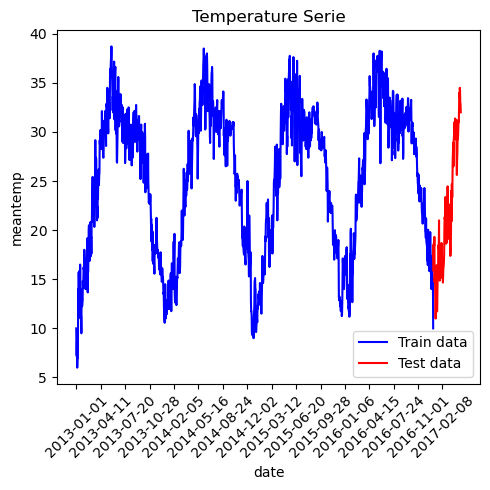

In [13]:
#plot the train and test data we have preparated

plt.figure(figsize=(5,5))
sns.lineplot(daily_climate['meantemp'].iloc[:train_climate.shape[0]], color='blue', label='Train data')
sns.lineplot(daily_climate['meantemp'].iloc[-test_climate.shape[0]:], color='red', label='Test data')
selected_dates = daily_climate.index[::100]
plt.xticks(selected_dates, rotation=45)
plt.title('Temperature Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [14]:
#check if it is a time series by looking at the autocorrelation
print(daily_climate['meantemp'].autocorr())

0.9738525070402949


In [15]:
daily_climate_ = daily_climate.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['meantemp'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,meantemp,Yesterday
date,,
2013-01-02,7.400000,10.000000
2013-01-03,7.166667,7.400000
2013-01-04,8.666667,7.166667
2013-01-05,6.000000,8.666667
2013-01-06,7.000000,6.000000


In [16]:
y = daily_climate_['meantemp']
X = daily_climate_['Yesterday']

In [17]:
X_train = X[: '2017-01-01']
X_test = X ['2017-01-01':]
y_train = y[:'2017-01-01']
y_test = y['2017-01-01':]

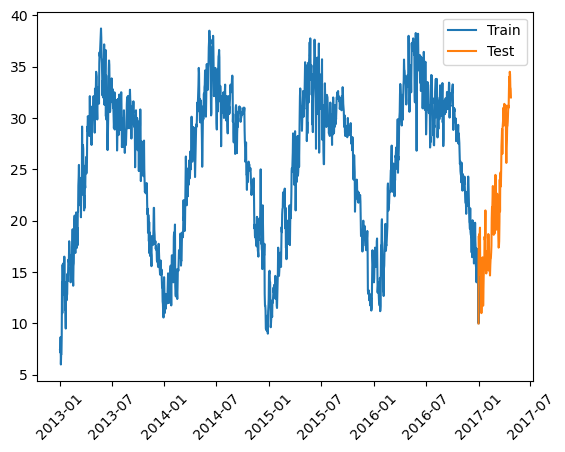

In [18]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

## Random Forest Regressor

In [19]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

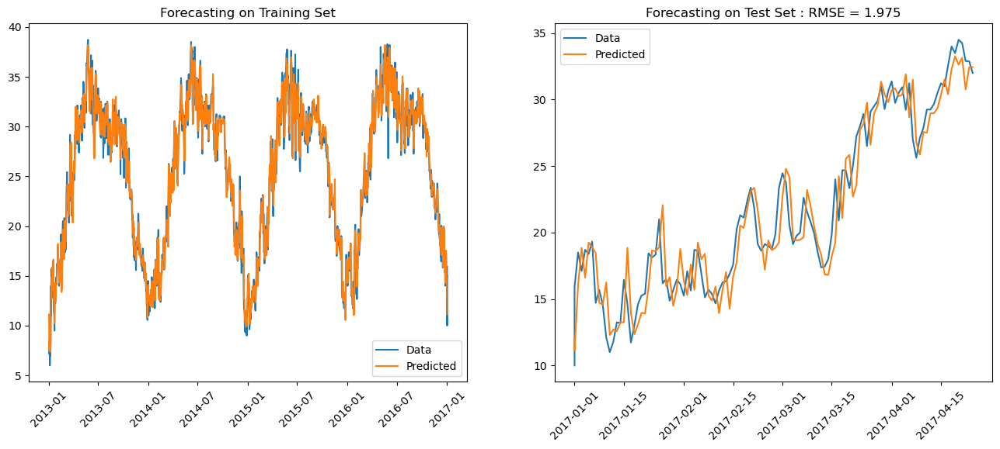

In [20]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['meantemp'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['meantemp'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

This prediction is quite similar to the one obtained with Linear Regression, also notice the value of the rmse are very similar

In [21]:
from joblib import dump
dump(rf_model, 'weather_pred_model.joblib')

['weather_pred_model.joblib']

In [22]:
X_test.values.reshape(-1,1)

array([[15.05263158],
       [10.        ],
       [15.91304348],
       [18.5       ],
       [17.11111111],
       [18.7       ],
       [18.38888889],
       [19.31818182],
       [14.70833333],
       [15.68421053],
       [14.57142857],
       [12.11111111],
       [11.        ],
       [11.78947368],
       [13.23529412],
       [13.2       ],
       [16.43478261],
       [14.65      ],
       [11.72222222],
       [13.04166667],
       [14.61904762],
       [15.26315789],
       [15.39130435],
       [18.44      ],
       [18.11764706],
       [18.34782609],
       [21.        ],
       [16.17857143],
       [16.5       ],
       [14.86363636],
       [15.66666667],
       [16.44444444],
       [16.125     ],
       [15.25      ],
       [17.09090909],
       [15.63636364],
       [18.7       ],
       [18.63157895],
       [16.88888889],
       [15.125     ],
       [15.7       ],
       [15.375     ],
       [14.66666667],
       [15.625     ],
       [16.25      ],
       [16

In [23]:
X_test

date
2017-01-01    15.052632
2017-01-01    10.000000
2017-01-02    15.913043
2017-01-03    18.500000
2017-01-04    17.111111
                ...    
2017-04-20    33.500000
2017-04-21    34.500000
2017-04-22    34.250000
2017-04-23    32.900000
2017-04-24    32.875000
Name: Yesterday, Length: 115, dtype: float64

In [24]:
import joblib
joblib.__version__

'1.2.0'

In [25]:
from joblib import load
loaded_model = load('weather_pred_model.joblib')


In [26]:
loaded_model

RandomForestRegressor(n_estimators=500)

In [27]:
from datetime import datetime

custom_date_str = '2024-11-01'

custom_date = datetime.strptime(custom_date_str, '%Y-%m-%d')

In [28]:
type(custom_date_str )

str

In [29]:
day_of_year = custom_date.timetuple().tm_yday

In [30]:
custom_feature = [[day_of_year]]
predicted_temperature = loaded_model.predict(custom_feature)

In [31]:
print(f'Predicted temperature for {custom_date_str}: {predicted_temperature[0]}')

Predicted temperature for 2024-11-01: 37.75340238095218


In [32]:
!pip install scikit-learn==1.3.2

^C


  Obtaining dependency information for scikit-learn==1.3.2 from https://files.pythonhosted.org/packages/4e/ba/ce9bd1cd4953336a0e213b29cb80bb11816f2a93de8c99f88ef0b446ad0c/scikit_learn-1.3.2-cp311-cp311-win_amd64.whl.metadata
   ---------------------------------------- 0.0/9.2 MB ? eta -:--:--
   ---------------------------------------- 0.0/9.2 MB ? eta -:--:--
   ---------------------------------------- 0.0/9.2 MB 653.6 kB/s eta 0:00:15
    --------------------------------------- 0.2/9.2 MB 1.6 MB/s eta 0:00:06
   - -------------------------------------- 0.2/9.2 MB 1.7 MB/s eta 0:00:06
   - -------------------------------------- 0.4/9.2 MB 2.2 MB/s eta 0:00:05
   -- ------------------------------------- 0.6/9.2 MB 2.6 MB/s eta 0:00:04
   --- ------------------------------------ 0.7/9.2 MB 2.7 MB/s eta 0:00:04
   --- ------------------------------------ 0.8/9.2 MB 2.4 MB/s eta 0:00:04
   --- ------------------------------------ 0.8/9.2 MB 2.3 MB/s eta 0:00:04
   --- --------------------

ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\user\\anaconda3\\Lib\\site-packages\\~klearn\\decomposition\\_cdnmf_fast.cp311-win_amd64.pyd'
Consider using the `--user` option or check the permissions.



## Time Series on Humidity

In [33]:
train_climate

,date,meantemp,humidity,wind_speed,meanpressure
0,2013-01-01,10.000000,84.500000,0.000000,1015.666667
1,2013-01-02,7.400000,92.000000,2.980000,1017.800000
2,2013-01-03,7.166667,87.000000,4.633333,1018.666667
3,2013-01-04,8.666667,71.333333,1.233333,1017.166667
4,2013-01-05,6.000000,86.833333,3.700000,1016.500000
...,...,...,...,...,...
1457,2016-12-28,17.217391,68.043478,3.547826,1015.565217
1458,2016-12-29,15.238095,87.857143,6.000000,1016.904762
1459,2016-12-30,14.095238,89.666667,6.266667,1017.904762
1460,2016-12-31,15.052632,87.000000,7.325000,1016.100000


In [35]:
daily_climate

,date,meantemp,humidity,wind_speed,meanpressure
0,2013-01-01,10.000000,84.500000,0.000000,1015.666667
1,2013-01-02,7.400000,92.000000,2.980000,1017.800000
2,2013-01-03,7.166667,87.000000,4.633333,1018.666667
3,2013-01-04,8.666667,71.333333,1.233333,1017.166667
4,2013-01-05,6.000000,86.833333,3.700000,1016.500000
...,...,...,...,...,...
109,2017-04-20,34.500000,27.500000,5.562500,998.625000
110,2017-04-21,34.250000,39.375000,6.962500,999.875000
111,2017-04-22,32.900000,40.900000,8.890000,1001.600000
112,2017-04-23,32.875000,27.500000,9.962500,1002.125000


In [43]:
#focus only on the humidity
daily_climate = daily_climate.drop(['meantemp', 'wind_speed', 'meanpressure'], axis=1)
daily_climate.head()

,humidity
date,
2013-01-01,84.500000
2013-01-02,92.000000
2013-01-03,87.000000
2013-01-04,71.333333
2013-01-05,86.833333


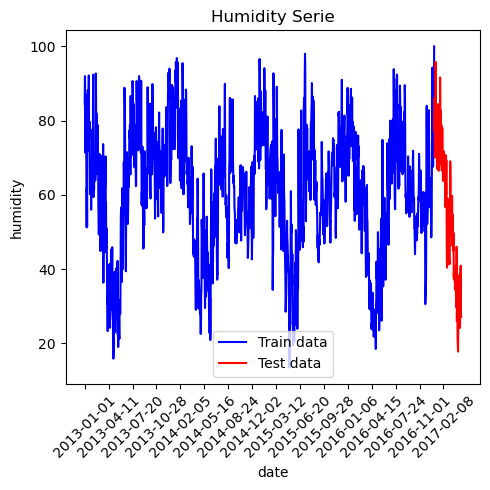

In [44]:
#plot the train and test data we have preparated

plt.figure(figsize=(5,5))
sns.lineplot(daily_climate['humidity'].iloc[:train_climate.shape[0]], color='blue', label='Train data')
sns.lineplot(daily_climate['humidity'].iloc[-test_climate.shape[0]:], color='red', label='Test data')
selected_dates = daily_climate.index[::100]
plt.xticks(selected_dates, rotation=45)
plt.title('Humidity Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [45]:
#check if it is a time series by looking at the autocorrelation
print(daily_climate['humidity'].autocorr())

0.8831227954603492


In [46]:
daily_climate_ = daily_climate.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['humidity'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,humidity,Yesterday
date,,
2013-01-02,92.000000,84.500000
2013-01-03,87.000000,92.000000
2013-01-04,71.333333,87.000000
2013-01-05,86.833333,71.333333
2013-01-06,82.800000,86.833333


In [47]:
y = daily_climate_['humidity']
X = daily_climate_['Yesterday']

In [48]:
X_train = X[: '2017-01-01']
X_test = X ['2017-01-01':]
y_train = y[:'2017-01-01']
y_test = y['2017-01-01':]

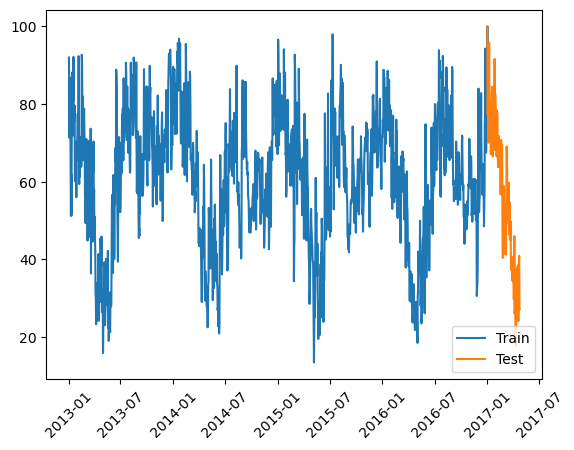

In [49]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [50]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=950)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

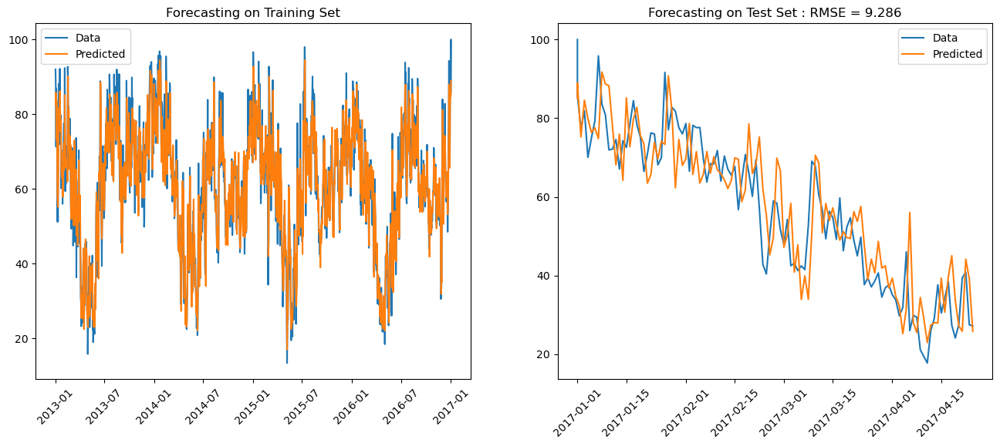

In [51]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['humidity'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['humidity'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [52]:
dump(rf_model, 'models\Delhi_humdity.joblib')

['models\\Delhi_humdity.joblib']

# **Mumbai**

## Temperature

In [53]:
mum_data = pd.read_csv("datas\mumbai_data.csv")

In [54]:
mum_data

,datetime,temp,dew,humidity,sealevelpressure,winddir,solarradiation,windspeed,precipprob,preciptype
0,01-01-2016,28.4,11.9,37.8,1016.4,147.5,216.1,16.6,0,0
1,02-01-2016,26.8,13.0,44.8,1017.2,110.3,215.7,16.6,0,0
2,03-01-2016,25.5,14.6,52.8,1015.7,145.3,221.1,18.4,0,0
3,04-01-2016,26.4,13.1,46.6,1015.3,126.9,216.2,16.6,0,0
4,05-01-2016,27.1,13.5,44.9,1014.4,125.5,208.1,16.6,0,0
...,...,...,...,...,...,...,...,...,...,...
1776,11-11-2020,27.4,12.2,41.5,1011.8,108.3,220.4,17.2,0,0
1777,12-11-2020,28.0,13.0,40.9,1012.6,148.4,225.1,16.6,0,0
1778,13-11-2020,28.4,18.7,56.9,1011.9,131.8,223.4,18.4,0,0
1779,14-11-2020,29.5,20.9,61.3,1010.2,154.2,232.7,19.3,0,0


In [57]:
 #convert date as a DateTime object
mum_data['datetime']=pd.to_datetime(mum_data['datetime'],format='mixed')

In [58]:
mum_data

,datetime,temp,dew,humidity,sealevelpressure,winddir,solarradiation,windspeed,precipprob,preciptype
0,2016-01-01,28.4,11.9,37.8,1016.4,147.5,216.1,16.6,0,0
1,2016-02-01,26.8,13.0,44.8,1017.2,110.3,215.7,16.6,0,0
2,2016-03-01,25.5,14.6,52.8,1015.7,145.3,221.1,18.4,0,0
3,2016-04-01,26.4,13.1,46.6,1015.3,126.9,216.2,16.6,0,0
4,2016-05-01,27.1,13.5,44.9,1014.4,125.5,208.1,16.6,0,0
...,...,...,...,...,...,...,...,...,...,...
1776,2020-11-11,27.4,12.2,41.5,1011.8,108.3,220.4,17.2,0,0
1777,2020-12-11,28.0,13.0,40.9,1012.6,148.4,225.1,16.6,0,0
1778,2020-11-13,28.4,18.7,56.9,1011.9,131.8,223.4,18.4,0,0
1779,2020-11-14,29.5,20.9,61.3,1010.2,154.2,232.7,19.3,0,0


In [59]:
mum_data.set_index(mum_data['datetime'], inplace=True)
mum_data = mum_data.drop('datetime', axis=1)
mum_data.head()

,temp,dew,humidity,sealevelpressure,winddir,solarradiation,windspeed,precipprob,preciptype
datetime,,,,,,,,,
2016-01-01,28.4,11.9,37.8,1016.4,147.5,216.1,16.6,0,0
2016-02-01,26.8,13.0,44.8,1017.2,110.3,215.7,16.6,0,0
2016-03-01,25.5,14.6,52.8,1015.7,145.3,221.1,18.4,0,0
2016-04-01,26.4,13.1,46.6,1015.3,126.9,216.2,16.6,0,0
2016-05-01,27.1,13.5,44.9,1014.4,125.5,208.1,16.6,0,0


In [60]:
#focus only on the temperature
mum_data = mum_data.drop(['humidity', 'dew', 'sealevelpressure','winddir','solarradiation','windspeed','precipprob','preciptype'], axis=1)
mum_data.head()

,temp
datetime,
2016-01-01,28.4
2016-02-01,26.8
2016-03-01,25.5
2016-04-01,26.4
2016-05-01,27.1


In [61]:
mum_data.shape

(1781, 1)

In [62]:
train_data = mum_data.iloc[:1000]  # First 1000 rows for training
test_data = mum_data.iloc[1000:]   # Rest for testing

In [63]:
test_data

,temp
datetime,
2018-09-27,29.3
2018-09-28,29.2
2018-09-29,29.5
2018-09-30,31.5
2018-01-10,31.3
...,...
2020-11-11,27.4
2020-12-11,28.0
2020-11-13,28.4


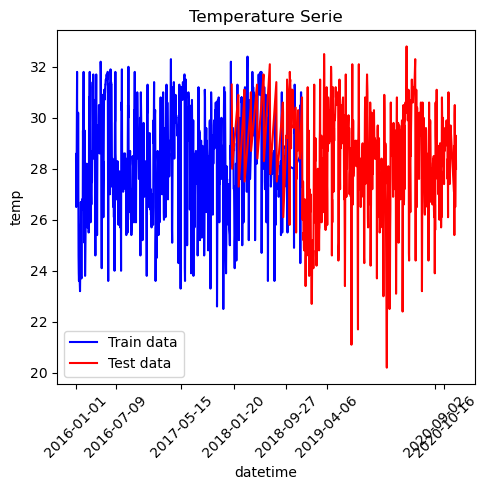

In [64]:
plt.figure(figsize=(5,5))
sns.lineplot(mum_data['temp'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(mum_data['temp'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = mum_data.index[::250]
plt.xticks(selected_dates, rotation=45)
plt.title('Temperature Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [65]:
print(mum_data['temp'].autocorr())

0.9080947874184664


In [66]:
daily_climate_ = mum_data.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['temp'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.tail(100)

,temp,Yesterday
datetime,,
2020-08-08,28.2,27.8
2020-09-08,29.0,28.2
2020-10-08,28.6,29.0
2020-11-08,28.2,28.6
2020-12-08,27.3,28.2
...,...,...
2020-11-11,27.4,28.1
2020-12-11,28.0,27.4
2020-11-13,28.4,28.0


In [67]:
y = daily_climate_['temp']
X = daily_climate_['Yesterday']

In [68]:
X_train = X[: '2018-09-27']
X_test = X ['2018-09-27':]
y_train = y[:'2018-09-27']
y_test = y['2018-09-27':]

In [69]:
X_test

datetime
2018-10-01    25.4
2018-11-01    27.0
2018-12-01    28.0
2018-10-02    26.1
2018-11-02    25.5
              ... 
2020-11-11    28.1
2020-12-11    27.4
2020-11-13    28.0
2020-11-14    28.4
2020-11-15    29.5
Name: Yesterday, Length: 781, dtype: float64

In [70]:
X_train

datetime
2016-02-01    28.4
2016-03-01    26.8
2016-04-01    25.5
2016-05-01    26.4
2016-06-01    27.1
              ... 
2018-05-12    28.7
2018-06-12    28.4
2018-07-12    28.3
2018-08-12    27.8
2018-09-12    27.5
Name: Yesterday, Length: 1000, dtype: float64

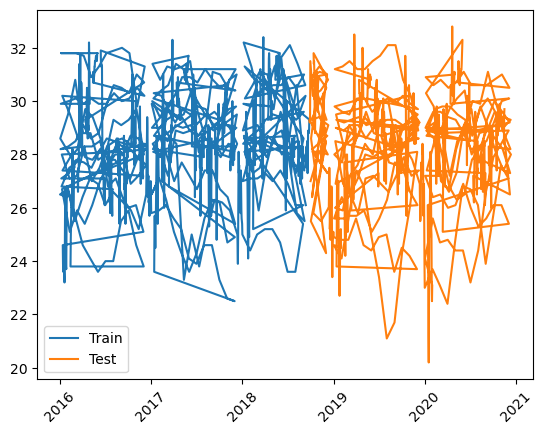

In [71]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [72]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

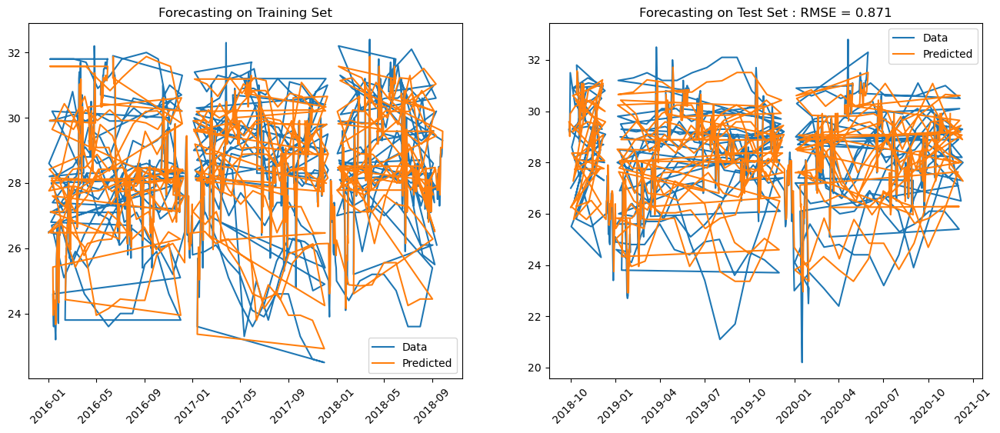

In [73]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['temp'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['temp'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [74]:
from joblib import dump
dump(rf_model, 'models\Mumbai_temperature.joblib')

['models\\Mumbai_temperature.joblib']

In [79]:
from datetime import datetime

custom_date_str = '2024-12-13'

custom_date = datetime.strptime(custom_date_str, '%Y-%m-%d')

In [80]:
day_of_year = custom_date.timetuple().tm_yday

In [81]:
custom_feature = [[day_of_year]]
predicted_temperature = rf_model.predict(custom_feature)

In [82]:
predicted_temperature

array([29.62586667])

## Humidity

In [84]:
mum_data = pd.read_csv("datas\mumbai_data.csv")

In [85]:
mum_data

,datetime,temp,dew,humidity,sealevelpressure,winddir,solarradiation,windspeed,precipprob,preciptype
0,01-01-2016,28.4,11.9,37.8,1016.4,147.5,216.1,16.6,0,0
1,02-01-2016,26.8,13.0,44.8,1017.2,110.3,215.7,16.6,0,0
2,03-01-2016,25.5,14.6,52.8,1015.7,145.3,221.1,18.4,0,0
3,04-01-2016,26.4,13.1,46.6,1015.3,126.9,216.2,16.6,0,0
4,05-01-2016,27.1,13.5,44.9,1014.4,125.5,208.1,16.6,0,0
...,...,...,...,...,...,...,...,...,...,...
1776,11-11-2020,27.4,12.2,41.5,1011.8,108.3,220.4,17.2,0,0
1777,12-11-2020,28.0,13.0,40.9,1012.6,148.4,225.1,16.6,0,0
1778,13-11-2020,28.4,18.7,56.9,1011.9,131.8,223.4,18.4,0,0
1779,14-11-2020,29.5,20.9,61.3,1010.2,154.2,232.7,19.3,0,0


In [87]:
 #convert date as a DateTime object
mum_data['datetime']=pd.to_datetime(mum_data['datetime'],format = 'mixed')

In [88]:
mum_data.set_index(mum_data['datetime'], inplace=True)
mum_data = mum_data.drop('datetime', axis=1)
mum_data.head()

,temp,dew,humidity,sealevelpressure,winddir,solarradiation,windspeed,precipprob,preciptype
datetime,,,,,,,,,
2016-01-01,28.4,11.9,37.8,1016.4,147.5,216.1,16.6,0,0
2016-02-01,26.8,13.0,44.8,1017.2,110.3,215.7,16.6,0,0
2016-03-01,25.5,14.6,52.8,1015.7,145.3,221.1,18.4,0,0
2016-04-01,26.4,13.1,46.6,1015.3,126.9,216.2,16.6,0,0
2016-05-01,27.1,13.5,44.9,1014.4,125.5,208.1,16.6,0,0


In [89]:
#focus only on the humidity
mum_data = mum_data.drop(['temp', 'dew', 'sealevelpressure','winddir','solarradiation','windspeed','precipprob','preciptype'], axis=1)
mum_data.head()

,humidity
datetime,
2016-01-01,37.8
2016-02-01,44.8
2016-03-01,52.8
2016-04-01,46.6
2016-05-01,44.9


In [90]:
mum_data

,humidity
datetime,
2016-01-01,37.8
2016-02-01,44.8
2016-03-01,52.8
2016-04-01,46.6
2016-05-01,44.9
...,...
2020-11-11,41.5
2020-12-11,40.9
2020-11-13,56.9


In [91]:
train_data = mum_data.iloc[:1000]  # First 1000 rows for training
test_data = mum_data.iloc[1000:]

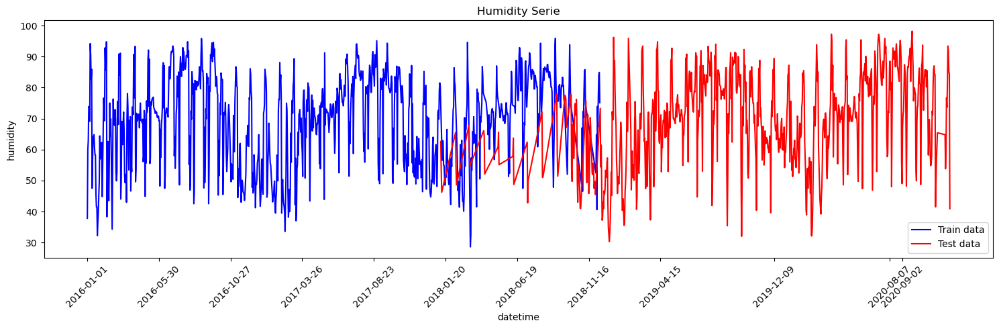

In [92]:
plt.figure(figsize=(15,5))
sns.lineplot(mum_data['humidity'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(mum_data['humidity'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = mum_data.index[::150]
plt.xticks(selected_dates, rotation=45)
plt.title('Humidity Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [93]:
print(mum_data['humidity'].autocorr())

0.9235484217720271


In [94]:
daily_climate_ = mum_data.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['humidity'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.tail()

,humidity,Yesterday
datetime,,
2020-11-11,41.5,48.7
2020-12-11,40.9,41.5
2020-11-13,56.9,40.9
2020-11-14,61.3,56.9
2020-11-15,65.4,61.3


In [95]:
y = daily_climate_['humidity']
X = daily_climate_['Yesterday']

In [96]:
X_train = X[: '2018-09-27']
X_test = X ['2018-09-27':]
y_train = y[:'2018-09-27']
y_test = y['2018-09-27':]

In [97]:
df_result_train

,temp,predicted
datetime,,
2016-02-01,26.8,27.995161
2016-03-01,25.5,26.888373
2016-04-01,26.4,25.779375
2016-05-01,27.1,26.469307
2016-06-01,26.9,27.121835
...,...,...
2018-05-12,28.4,28.515440
2018-06-12,28.3,27.995161
2018-07-12,27.8,28.421386


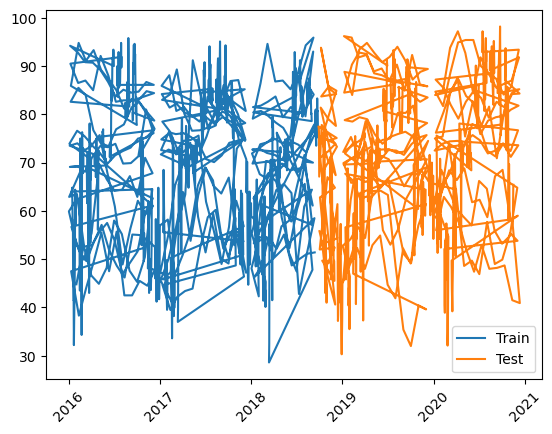

In [98]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [99]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

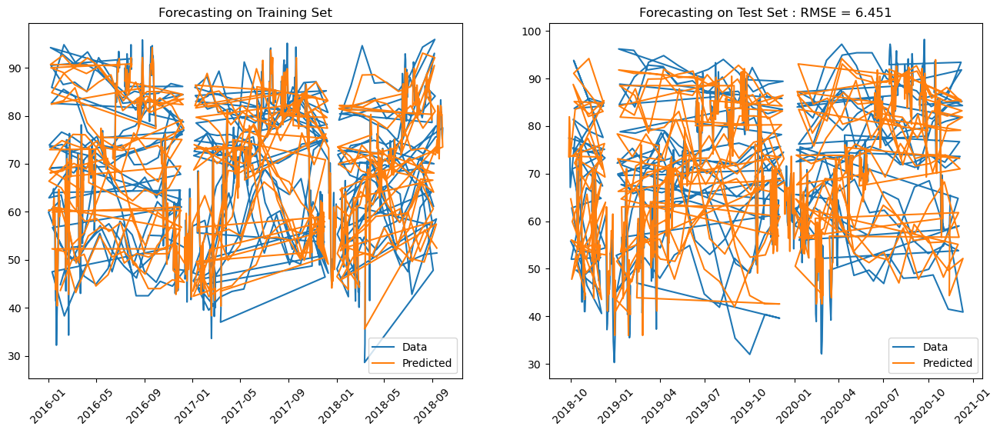

In [100]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['humidity'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['humidity'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [101]:
from joblib import dump
dump(rf_model, 'models\Mumbai_humidity.joblib')

['models\\Mumbai_humidity.joblib']

# **Kolkata**

## Temperature

In [104]:
import pandas as pd
df = pd.read_csv("datas/kolkata_data.csv")

In [105]:
df = df.drop("Unnamed: 0",axis = 1)

In [106]:
df

,Day,TEMPERATURE,HUMIDITY
0,2015-01-01,20.333333,83.208333
1,2015-01-02,23.041667,76.208333
2,2015-01-03,24.375000,76.750000
3,2015-01-04,23.916667,68.250000
4,2015-01-05,21.250000,51.375000
...,...,...,...
2187,2020-12-27,23.083333,28.583333
2188,2020-12-28,23.958333,30.250000
2189,2020-12-29,24.750000,32.458333
2190,2020-12-30,23.875000,34.125000


In [107]:
 #convert date as a DateTime object
df['Day']=pd.to_datetime(df['Day'])

In [108]:
df.set_index(df['Day'], inplace=True)
df = df.drop('Day', axis=1)
df.head()

,TEMPERATURE,HUMIDITY
Day,,
2015-01-01,20.333333,83.208333
2015-01-02,23.041667,76.208333
2015-01-03,24.375000,76.750000
2015-01-04,23.916667,68.250000
2015-01-05,21.250000,51.375000


In [109]:
#focus only on the temperature
df = df.drop(['HUMIDITY'], axis=1)
df.head()

,TEMPERATURE
Day,
2015-01-01,20.333333
2015-01-02,23.041667
2015-01-03,24.375000
2015-01-04,23.916667
2015-01-05,21.250000


In [110]:
df.shape

(2192, 1)

In [111]:
train_data = df.iloc[:1500]  # First 1000 rows for training
test_data = df.iloc[1500:]   # Rest for testing

In [112]:
train_data

,TEMPERATURE
Day,
2015-01-01,20.333333
2015-01-02,23.041667
2015-01-03,24.375000
2015-01-04,23.916667
2015-01-05,21.250000
...,...
2019-02-04,27.208333
2019-02-05,26.500000
2019-02-06,26.791667


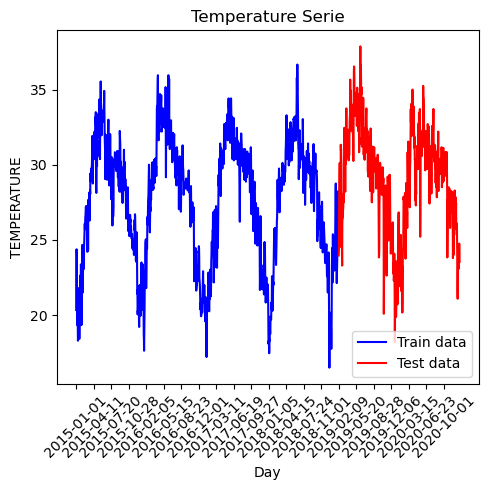

In [113]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(5,5))
sns.lineplot(df['TEMPERATURE'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['TEMPERATURE'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df.index[::100]
plt.xticks(selected_dates, rotation=45)
plt.title('Temperature Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [114]:
print(df['TEMPERATURE'].autocorr())

0.9670074828486999


In [115]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['TEMPERATURE'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.tail(100)

,TEMPERATURE,Yesterday
Day,,
2020-09-23,29.541667,29.208333
2020-09-24,28.791667,29.541667
2020-09-25,29.583333,28.791667
2020-09-26,29.750000,29.583333
2020-09-27,29.833333,29.750000
...,...,...
2020-12-27,23.083333,23.708333
2020-12-28,23.958333,23.083333
2020-12-29,24.750000,23.958333


In [116]:
y = daily_climate_['TEMPERATURE']
X = daily_climate_['Yesterday']

In [117]:
X_train = X[: '2019-02-08']
X_test = X ['2019-02-08':]
y_train = y[:'2019-02-08']
y_test = y['2019-02-08':]

In [118]:
X_test

Day
2019-02-08    28.250000
2019-02-09    25.375000
2019-02-10    23.958333
2019-02-11    24.291667
2019-02-12    24.708333
                ...    
2020-12-27    23.708333
2020-12-28    23.083333
2020-12-29    23.958333
2020-12-30    24.750000
2020-12-31    23.875000
Name: Yesterday, Length: 693, dtype: float64

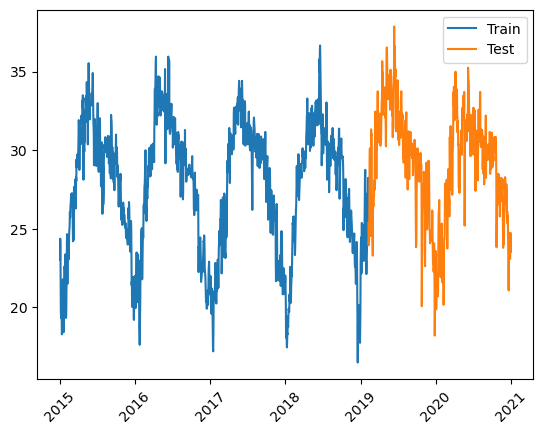

In [119]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [120]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

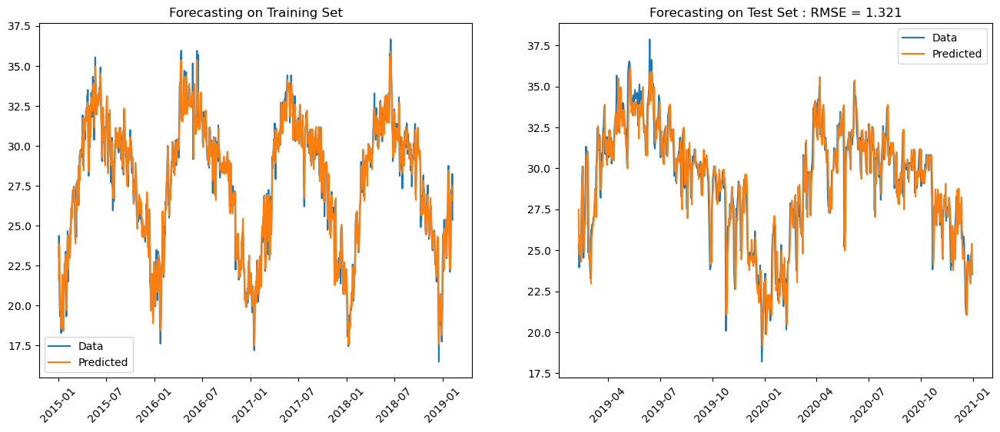

In [121]:
import math
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['TEMPERATURE'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)

plt.plot(df_result_test['TEMPERATURE'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [122]:
from joblib import dump
dump(rf_model, 'models\Kolkata_temperature.joblib')

['models\\Kolkata_temperature.joblib']

## Humidity

In [125]:
df = pd.read_csv("datas/kolkata_data.csv")

In [126]:
df = df.drop("Unnamed: 0",axis = 1)

In [127]:
 #convert date as a DateTime object
df['Day']=pd.to_datetime(df['Day'])

In [128]:
df.set_index(df['Day'], inplace=True)
df = df.drop('Day', axis=1)
df.head()

,TEMPERATURE,HUMIDITY
Day,,
2015-01-01,20.333333,83.208333
2015-01-02,23.041667,76.208333
2015-01-03,24.375000,76.750000
2015-01-04,23.916667,68.250000
2015-01-05,21.250000,51.375000


In [129]:
#focus only on the Humidity
df = df.drop(['TEMPERATURE'], axis=1)
df.head()

,HUMIDITY
Day,
2015-01-01,83.208333
2015-01-02,76.208333
2015-01-03,76.750000
2015-01-04,68.250000
2015-01-05,51.375000


In [130]:
train_data = df.iloc[:1500]  # First 1000 rows for training
test_data = df.iloc[1500:]   # Rest for testing

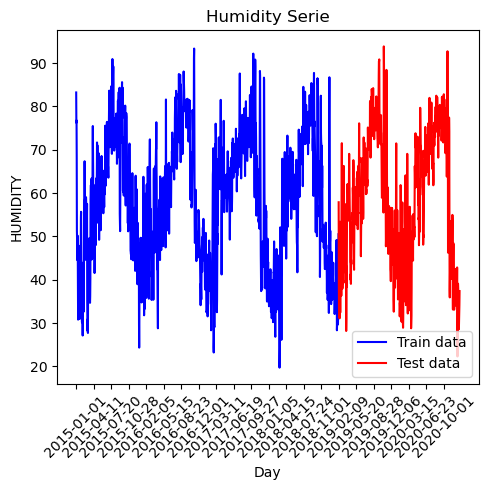

In [131]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(5,5))
sns.lineplot(df['HUMIDITY'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['HUMIDITY'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df.index[::100]
plt.xticks(selected_dates, rotation=45)
plt.title('Humidity Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [132]:
print(df['HUMIDITY'].autocorr())

0.9122817742432482


In [133]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['HUMIDITY'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.tail(100)

,HUMIDITY,Yesterday
Day,,
2020-09-23,79.458333,81.541667
2020-09-24,82.250000,79.458333
2020-09-25,77.500000,82.250000
2020-09-26,77.250000,77.500000
2020-09-27,77.250000,77.250000
...,...,...
2020-12-27,28.583333,30.583333
2020-12-28,30.250000,28.583333
2020-12-29,32.458333,30.250000


In [134]:
y = daily_climate_['HUMIDITY']
X = daily_climate_['Yesterday']

In [135]:
X_train = X[: '2019-02-08']
X_test = X ['2019-02-08':]
y_train = y[:'2019-02-08']
y_test = y['2019-02-08':]

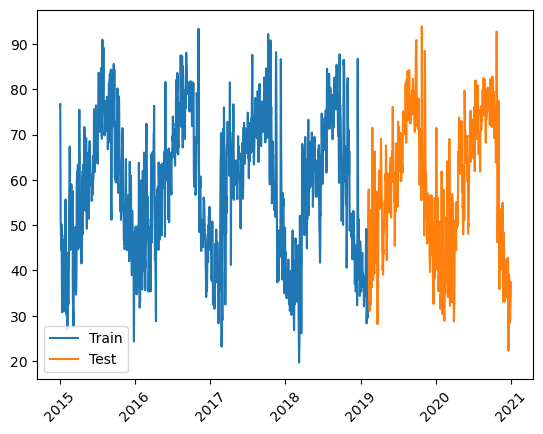

In [136]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [137]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

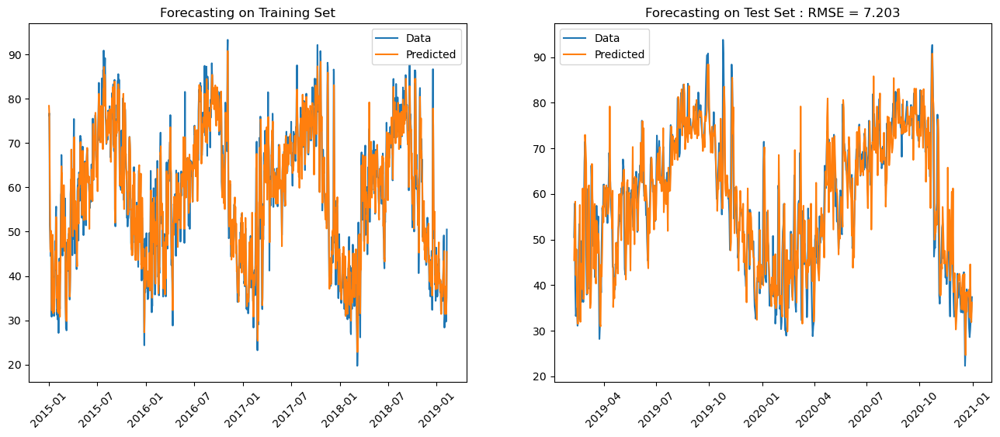

In [138]:
import math
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['HUMIDITY'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)

plt.plot(df_result_test['HUMIDITY'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [139]:
from joblib import dump
dump(rf_model, 'models\Kolkata_humidity.joblib')

['models\\Kolkata_humidity.joblib']

# **Jaipur**

## Temperature

In [140]:
import pandas as pd

In [163]:
df = pd.read_csv("datas/Jaipur,India 2016-01-01 to 2018-09-15.csv")

In [164]:
df = df.drop("name",axis = 1)

In [165]:
df = df.drop(["severerisk","conditions","description","icon","stations","sunset","uvindex","solarenergy"],axis = 1)

In [166]:
df = df.drop(["tempmax","tempmin","feelslikemax","feelslikemin","feelslike","dew","precip","snowdepth","windgust","windspeed","winddir","sealevelpressure","cloudcover","visibility","solarradiation","sunrise","moonphase"],axis = 1)

In [167]:
df = df.drop(["precipprob","precipcover","preciptype","snow"],axis=1)

In [168]:
df

,datetime,temp,humidity
0,2016-01-01,65.3,41.3
1,2016-01-02,63.7,37.0
2,2016-01-03,65.5,35.6
3,2016-01-04,66.3,35.2
4,2016-01-05,67.7,35.8
...,...,...,...
984,2018-09-11,77.5,91.3
985,2018-09-12,81.4,77.3
986,2018-09-13,80.2,74.8
987,2018-09-14,81.3,70.8


In [169]:
#convert date as a DateTime object
df['datetime']=pd.to_datetime(df['datetime'])

In [170]:
df.set_index(df['datetime'], inplace=True)
df = df.drop('datetime', axis=1)
df.head()

,temp,humidity
datetime,,
2016-01-01,65.3,41.3
2016-01-02,63.7,37.0
2016-01-03,65.5,35.6
2016-01-04,66.3,35.2
2016-01-05,67.7,35.8


In [149]:
df = df.drop(['humidity'], axis=1)

In [150]:
df

,temp
datetime,
2016-01-01,65.3
2016-01-02,63.7
2016-01-03,65.5
2016-01-04,66.3
2016-01-05,67.7
...,...
2018-09-11,77.5
2018-09-12,81.4
2018-09-13,80.2


In [151]:
train_data = df.iloc[:800]  # First 800 rows for training
test_data = df.iloc[800:]

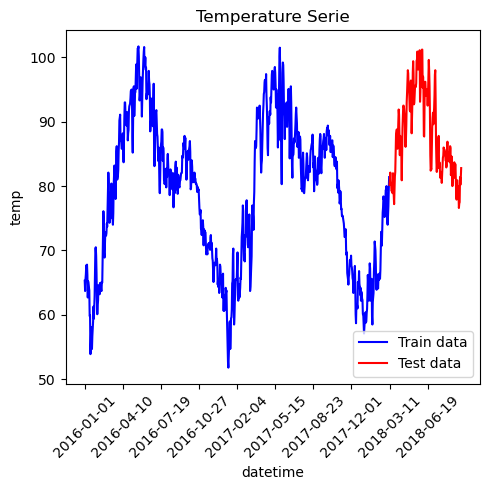

In [152]:
#plot the train and test data we have preparated

plt.figure(figsize=(5,5))
sns.lineplot(df['temp'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['temp'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df.index[::100]
plt.xticks(selected_dates, rotation=45)
plt.title('Temperature Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [153]:
#check if it is a time series by looking at the autocorrelation
print(df['temp'].autocorr())

0.9803557499275286


In [154]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['temp'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,temp,Yesterday
datetime,,
2016-01-02,63.7,65.3
2016-01-03,65.5,63.7
2016-01-04,66.3,65.5
2016-01-05,67.7,66.3
2016-01-06,67.3,67.7


In [155]:
y = daily_climate_['temp']
X = daily_climate_['Yesterday']

In [156]:
train_data

,temp
datetime,
2016-01-01,65.3
2016-01-02,63.7
2016-01-03,65.5
2016-01-04,66.3
2016-01-05,67.7
...,...
2018-03-06,74.0
2018-03-07,75.4
2018-03-08,76.9


In [157]:
X_train = X[: '2018-03-10']
X_test = X ['2018-03-10':]
y_train = y[:'2018-03-10']
y_test = y['2018-03-10':]

In [158]:
X_test

datetime
2018-03-10    79.6
2018-03-11    81.4
2018-03-12    80.2
2018-03-13    81.1
2018-03-14    82.1
              ... 
2018-09-11    77.3
2018-09-12    77.5
2018-09-13    81.4
2018-09-14    80.2
2018-09-15    81.3
Name: Yesterday, Length: 190, dtype: float64

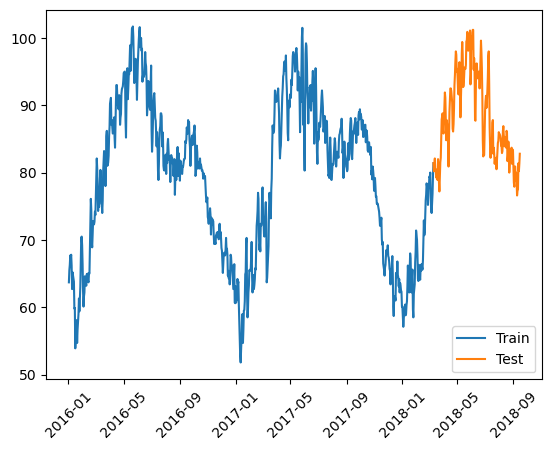

In [159]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [160]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

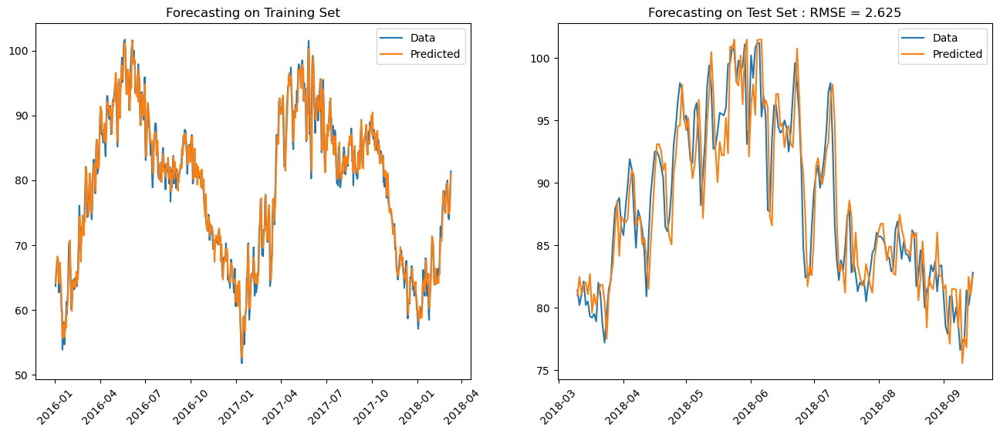

In [161]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['temp'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['temp'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [162]:
from joblib import dump
dump(rf_model,'models\Jaipur_temperature.joblib')

['models\\Jaipur_temperature.joblib']

## Humidity

In [171]:
df

,temp,humidity
datetime,,
2016-01-01,65.3,41.3
2016-01-02,63.7,37.0
2016-01-03,65.5,35.6
2016-01-04,66.3,35.2
2016-01-05,67.7,35.8
...,...,...
2018-09-11,77.5,91.3
2018-09-12,81.4,77.3
2018-09-13,80.2,74.8


In [172]:
df = df.drop("temp",axis = 1)

In [173]:
train_data = df.iloc[:800]  # First 800 rows for training
test_data = df.iloc[800:]

In [174]:
train_data

,humidity
datetime,
2016-01-01,41.3
2016-01-02,37.0
2016-01-03,35.6
2016-01-04,35.2
2016-01-05,35.8
...,...
2018-03-06,29.7
2018-03-07,26.7
2018-03-08,21.0


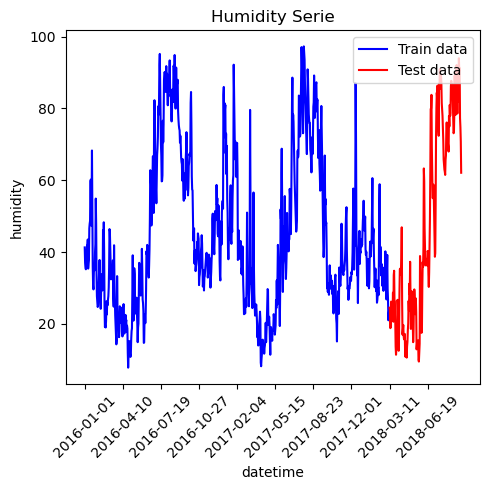

In [175]:
#plot the train and test data we have preparated

plt.figure(figsize=(5,5))
sns.lineplot(df['humidity'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['humidity'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df.index[::100]
plt.xticks(selected_dates, rotation=45)
plt.title('Humidity Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [176]:
print(df['humidity'].autocorr())

0.9556615989508771


In [177]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['humidity'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,humidity,Yesterday
datetime,,
2016-01-02,37.0,41.3
2016-01-03,35.6,37.0
2016-01-04,35.2,35.6
2016-01-05,35.8,35.2
2016-01-06,39.2,35.8


In [178]:
y = daily_climate_['humidity']
X = daily_climate_['Yesterday']

In [179]:
X_train = X[: '2018-03-10']
X_test = X ['2018-03-10':]
y_train = y[:'2018-03-10']
y_test = y['2018-03-10':]

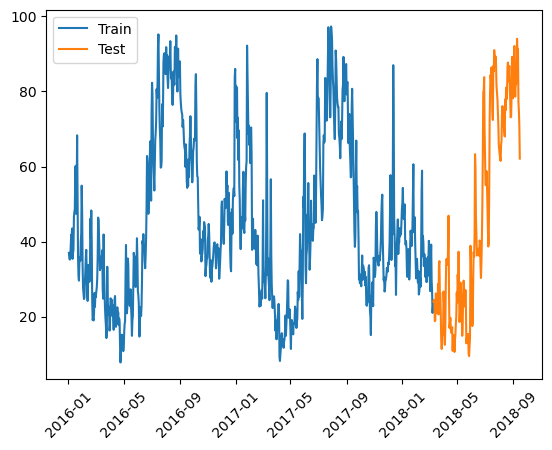

In [180]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [181]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

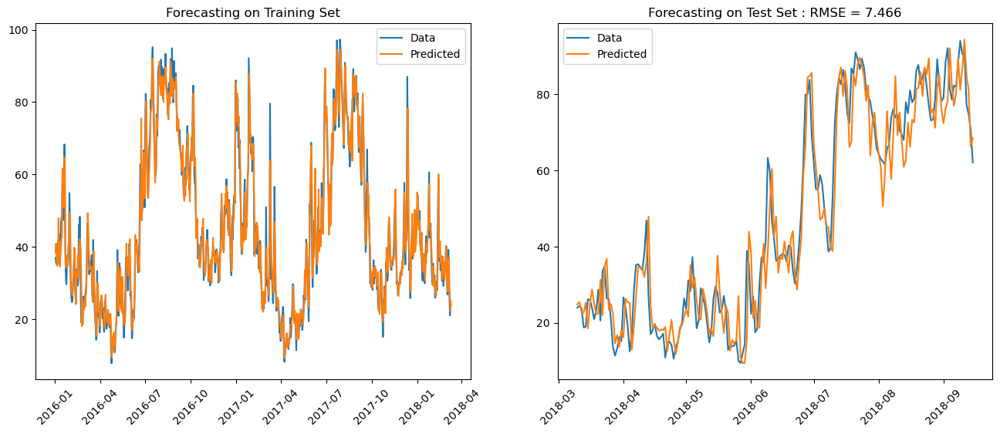

In [182]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['humidity'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['humidity'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [183]:
dump(rf_model,'models\Jaipur_humidity.joblib')

['models\\Jaipur_humidity.joblib']

# **Ranchi**

In [209]:
df = pd.read_csv("datas/Ranchi,India 2016-01-01 to 2018-09-04.csv")

In [210]:
df

,name,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,solarenergy,uvindex,severerisk,sunrise,sunset,moonphase,conditions,description,icon,stations
0,"Ranchi,India",2016-01-01,28.1,10.1,18.3,26.8,10.1,18.2,5.6,46.6,...,16.1,7,NaN,2016-01-01T06:30:17,2016-01-01T17:13:40,0.72,Clear,Clear conditions throughout the day.,clear-day,"42701099999,remote"
1,"Ranchi,India",2016-01-02,27.1,10.1,18.2,26.1,10.1,18.1,4.0,44.2,...,15.5,7,NaN,2016-01-02T06:30:36,2016-01-02T17:14:19,0.75,Clear,Clear conditions throughout the day.,clear-day,"42701099999,remote"
2,"Ranchi,India",2016-01-03,25.4,11.1,16.8,25.4,11.1,16.8,4.1,47.1,...,15.9,7,NaN,2016-01-03T06:30:53,2016-01-03T17:14:58,0.78,Clear,Clear conditions throughout the day.,clear-day,"42701099999,remote"
3,"Ranchi,India",2016-01-04,24.2,8.9,16.2,24.2,8.9,16.2,4.0,47.5,...,15.6,7,NaN,2016-01-04T06:31:09,2016-01-04T17:15:38,0.81,Clear,Clear conditions throughout the day.,clear-day,"42701099999,remote"
4,"Ranchi,India",2016-01-05,27.0,9.1,16.9,26.1,9.1,16.9,3.4,43.8,...,15.8,7,NaN,2016-01-05T06:31:23,2016-01-05T17:16:18,0.85,Clear,Clear conditions throughout the day.,clear-day,"42701099999,remote"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
973,"Ranchi,India",2018-08-31,30.9,24.0,26.4,37.8,24.0,27.9,24.0,87.6,...,12.2,4,NaN,2018-08-31T05:30:16,2018-08-31T18:07:43,0.67,"Rain, Partially cloudy",Partly cloudy throughout the day with afternoo...,rain,"42701099999,VERC"
974,"Ranchi,India",2018-09-01,30.0,23.8,25.5,36.2,23.8,26.5,23.6,89.7,...,17.0,7,NaN,2018-09-01T05:30:35,2018-09-01T18:06:45,0.70,"Rain, Partially cloudy",Partly cloudy throughout the day with rain.,rain,"42701099999,VERC"
975,"Ranchi,India",2018-09-02,25.0,23.0,24.0,25.0,23.0,24.0,23.3,95.9,...,12.9,6,NaN,2018-09-02T05:30:55,2018-09-02T18:05:47,0.74,"Rain, Partially cloudy",Partly cloudy throughout the day with rain in ...,rain,"42701099999,VERC"
976,"Ranchi,India",2018-09-03,29.0,23.0,25.0,32.7,23.0,25.6,22.8,88.2,...,12.4,6,NaN,2018-09-03T05:31:15,2018-09-03T18:04:49,0.75,"Rain, Partially cloudy",Partly cloudy throughout the day with rain.,rain,"42701099999,VERC"


In [211]:
df = df.drop("name",axis = 1)

In [212]:
df = df.drop(["severerisk","conditions","description","icon","stations","sunset","uvindex","solarenergy"],axis = 1)

In [213]:
df = df.drop(["tempmax","tempmin","feelslikemax","feelslikemin","feelslike","dew","precip","snowdepth","windgust","windspeed","winddir","sealevelpressure","cloudcover","visibility","solarradiation","sunrise","moonphase"],axis = 1)

In [214]:
df = df.drop(["precipprob","precipcover","preciptype","snow"],axis=1)

In [215]:
df

,datetime,temp,humidity
0,2016-01-01,18.3,46.6
1,2016-01-02,18.2,44.2
2,2016-01-03,16.8,47.1
3,2016-01-04,16.2,47.5
4,2016-01-05,16.9,43.8
...,...,...,...
973,2018-08-31,26.4,87.6
974,2018-09-01,25.5,89.7
975,2018-09-02,24.0,95.9
976,2018-09-03,25.0,88.2


In [216]:
#convert date as a DateTime object
df['datetime']=pd.to_datetime(df['datetime'])

In [217]:
df.set_index(df['datetime'], inplace=True)
df = df.drop('datetime', axis=1)
df.head()

,temp,humidity
datetime,,
2016-01-01,18.3,46.6
2016-01-02,18.2,44.2
2016-01-03,16.8,47.1
2016-01-04,16.2,47.5
2016-01-05,16.9,43.8


In [195]:
df = df.drop(['humidity'], axis=1)

In [196]:
df

,temp
datetime,
2016-01-01,18.3
2016-01-02,18.2
2016-01-03,16.8
2016-01-04,16.2
2016-01-05,16.9
...,...
2018-08-31,26.4
2018-09-01,25.5
2018-09-02,24.0


In [197]:
train_data = df.iloc[:800]  # First 800 rows for training
test_data = df.iloc[800:]

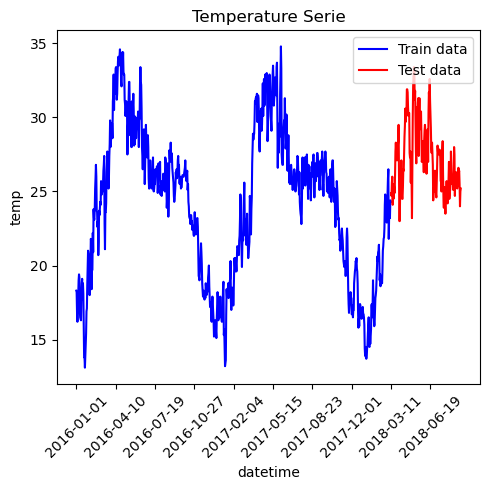

In [198]:
#plot the train and test data we have preparated

plt.figure(figsize=(5,5))
sns.lineplot(df['temp'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['temp'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df.index[::100]
plt.xticks(selected_dates, rotation=45)
plt.title('Temperature Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [199]:
#check if it is a time series by looking at the autocorrelation
print(df['temp'].autocorr())

0.9724386976486389


In [200]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['temp'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,temp,Yesterday
datetime,,
2016-01-02,18.2,18.3
2016-01-03,16.8,18.2
2016-01-04,16.2,16.8
2016-01-05,16.9,16.2
2016-01-06,18.0,16.9


In [201]:
y = daily_climate_['temp']
X = daily_climate_['Yesterday']

In [202]:
train_data

,temp
datetime,
2016-01-01,18.3
2016-01-02,18.2
2016-01-03,16.8
2016-01-04,16.2
2016-01-05,16.9
...,...
2018-03-06,23.4
2018-03-07,23.5
2018-03-08,23.2


In [203]:
X_train = X[: '2018-03-10']
X_test = X ['2018-03-10':]
y_train = y[:'2018-03-10']
y_test = y['2018-03-10':]

In [204]:
X_test

datetime
2018-03-10    24.4
2018-03-11    24.3
2018-03-12    24.9
2018-03-13    24.7
2018-03-14    25.6
              ... 
2018-08-31    26.3
2018-09-01    26.4
2018-09-02    25.5
2018-09-03    24.0
2018-09-04    25.0
Name: Yesterday, Length: 179, dtype: float64

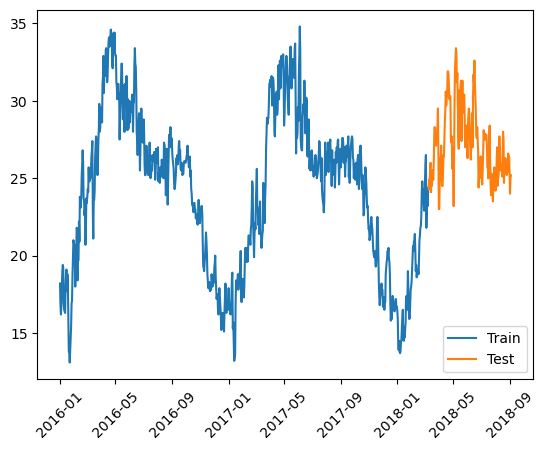

In [205]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [206]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

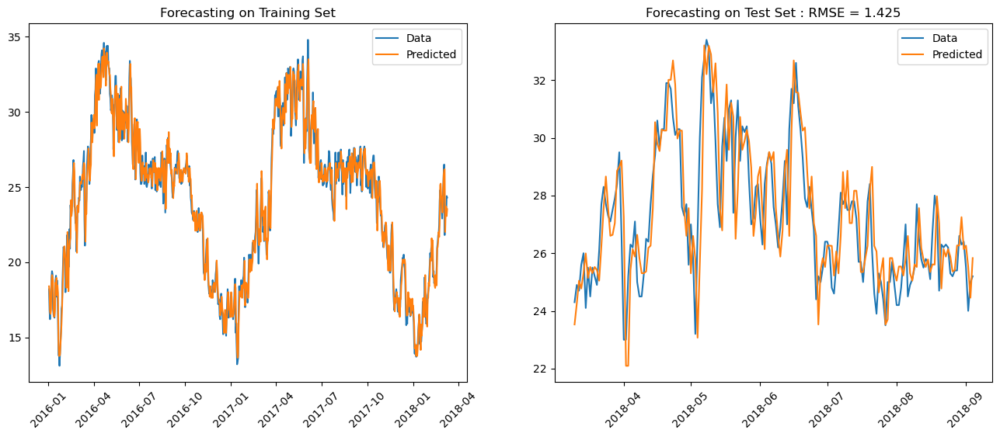

In [207]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['temp'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['temp'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [208]:
dump(rf_model,"models\Ranchi_temperature.joblib")

['models\\Ranchi_temperature.joblib']

## Humidity

In [218]:
df = df.drop("temp",axis = 1)

In [219]:
train_data = df.iloc[:800]  # First 800 rows for training
test_data = df.iloc[800:]

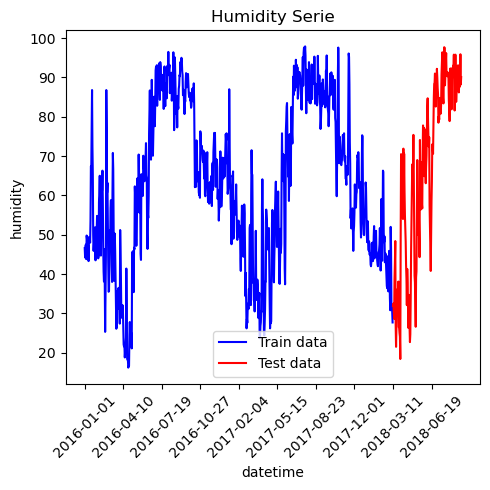

In [220]:
#plot the train and test data we have preparated

plt.figure(figsize=(5,5))
sns.lineplot(df['humidity'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['humidity'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df.index[::100]
plt.xticks(selected_dates, rotation=45)
plt.title('Humidity Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [221]:
#check if it is a time series by looking at the autocorrelation
print(df['humidity'].autocorr())

0.9450842703879507


In [222]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['humidity'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,humidity,Yesterday
datetime,,
2016-01-02,44.2,46.6
2016-01-03,47.1,44.2
2016-01-04,47.5,47.1
2016-01-05,43.8,47.5
2016-01-06,49.8,43.8


In [223]:
y = daily_climate_['humidity']
X = daily_climate_['Yesterday']

In [224]:
train_data

,humidity
datetime,
2016-01-01,46.6
2016-01-02,44.2
2016-01-03,47.1
2016-01-04,47.5
2016-01-05,43.8
...,...
2018-03-06,46.4
2018-03-07,31.5
2018-03-08,32.2


In [225]:
X_train = X[: '2018-03-10']
X_test = X ['2018-03-10':]
y_train = y[:'2018-03-10']
y_test = y['2018-03-10':]

In [226]:
X_test

datetime
2018-03-10    30.4
2018-03-11    27.7
2018-03-12    31.9
2018-03-13    32.5
2018-03-14    30.8
              ... 
2018-08-31    89.1
2018-09-01    87.6
2018-09-02    89.7
2018-09-03    95.9
2018-09-04    88.2
Name: Yesterday, Length: 179, dtype: float64

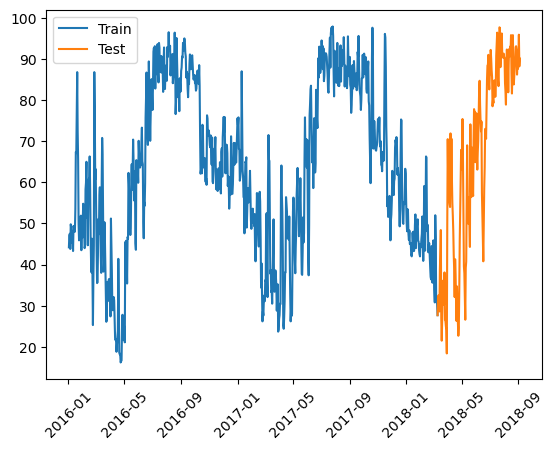

In [227]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [228]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

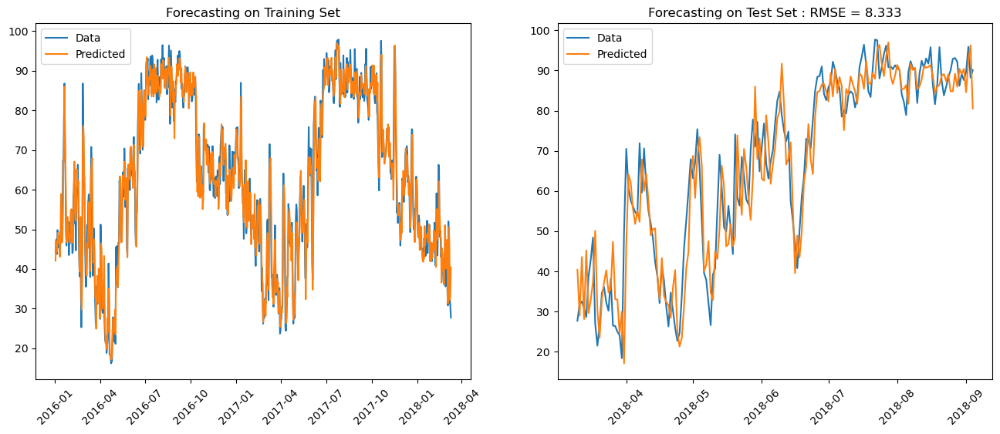

In [229]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['humidity'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['humidity'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [230]:
dump(rf_model,"models\Ranchi_humidity.joblib")

['models\\Ranchi_humidity.joblib']

# **Ahmadabad**

## Temperature

In [251]:
df = pd.read_csv("datas/Ahmadabad_weather.csv")

In [252]:
df = df.drop("Unnamed: 0",axis = 1)

In [253]:
df

,T2M,RH2M,Date
0,23.20,22.06,2016-01-01
1,22.16,23.56,2016-01-02
2,22.61,23.12,2016-01-03
3,23.37,22.38,2016-01-04
4,22.92,25.56,2016-01-05
...,...,...,...
1823,13.94,32.06,2020-12-28
1824,14.34,32.56,2020-12-29
1825,15.33,36.50,2020-12-30
1826,18.11,48.38,2020-12-31


In [254]:
#convert date as a DateTime object
df['Date']=pd.to_datetime(df['Date'])

In [255]:
df

,T2M,RH2M,Date
0,23.20,22.06,2016-01-01
1,22.16,23.56,2016-01-02
2,22.61,23.12,2016-01-03
3,23.37,22.38,2016-01-04
4,22.92,25.56,2016-01-05
...,...,...,...
1823,13.94,32.06,2020-12-28
1824,14.34,32.56,2020-12-29
1825,15.33,36.50,2020-12-30
1826,18.11,48.38,2020-12-31


In [256]:
#set date as the key of the dataset
df.set_index(df['Date'], inplace=True)
df = df.drop('Date', axis=1)
df.head()

,T2M,RH2M
Date,,
2016-01-01,23.20,22.06
2016-01-02,22.16,23.56
2016-01-03,22.61,23.12
2016-01-04,23.37,22.38
2016-01-05,22.92,25.56


In [257]:
df

,T2M,RH2M
Date,,
2016-01-01,23.20,22.06
2016-01-02,22.16,23.56
2016-01-03,22.61,23.12
2016-01-04,23.37,22.38
2016-01-05,22.92,25.56
...,...,...
2020-12-28,13.94,32.06
2020-12-29,14.34,32.56
2020-12-30,15.33,36.50


In [238]:
#focus only on the temperature
df = df.drop(['RH2M'], axis=1)
df.head()

,T2M
Date,
2016-01-01,23.20
2016-01-02,22.16
2016-01-03,22.61
2016-01-04,23.37
2016-01-05,22.92


In [239]:
df[:100]

,T2M
Date,
2016-01-01,23.20
2016-01-02,22.16
2016-01-03,22.61
2016-01-04,23.37
2016-01-05,22.92
...,...
2016-04-05,31.25
2016-04-06,31.33
2016-04-07,30.45


In [240]:
train_data = df.iloc[:1000]  # First 1000 rows for training
test_data = df.iloc[1000:]

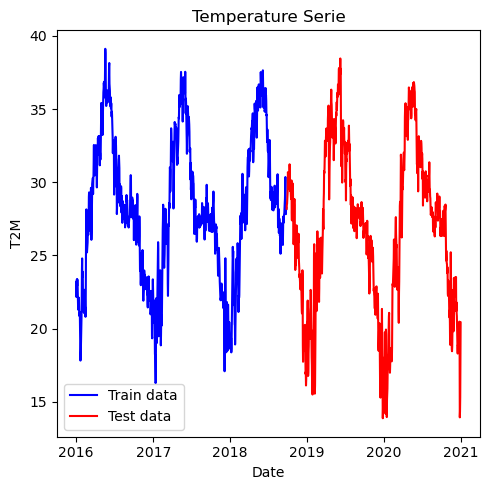

In [241]:
#plot the train and test data we have preparated

plt.figure(figsize=(5,5))
sns.lineplot(df['T2M'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['T2M'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df[::100]
# plt.xticks(selected_dates, rotation=45)
plt.title('Temperature Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [242]:
#check if it is a time series by looking at the autocorrelation
print(df['T2M'].autocorr())

0.9838749714038606


In [243]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['T2M'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,T2M,Yesterday
Date,,
2016-01-02,22.16,23.20
2016-01-03,22.61,22.16
2016-01-04,23.37,22.61
2016-01-05,22.92,23.37
2016-01-06,23.37,22.92


In [244]:
train_data

,T2M
Date,
2016-01-01,23.20
2016-01-02,22.16
2016-01-03,22.61
2016-01-04,23.37
2016-01-05,22.92
...,...
2018-09-22,28.19
2018-09-23,27.82
2018-09-24,28.11


In [245]:
y = daily_climate_['T2M']
X = daily_climate_['Yesterday']

In [246]:
X_train = X[: '2018-09-26']
X_test = X ['2018-09-26':]
y_train = y[:'2018-09-26']
y_test = y['2018-09-26':]

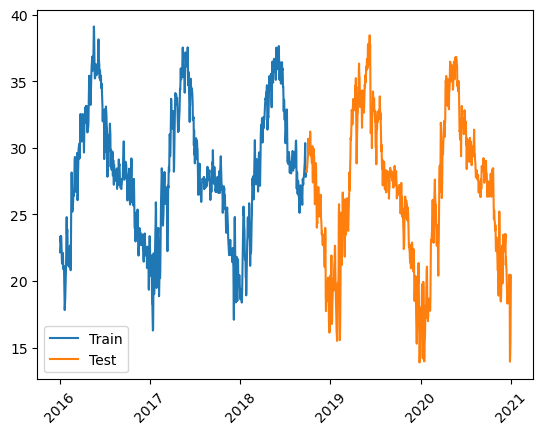

In [247]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [248]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

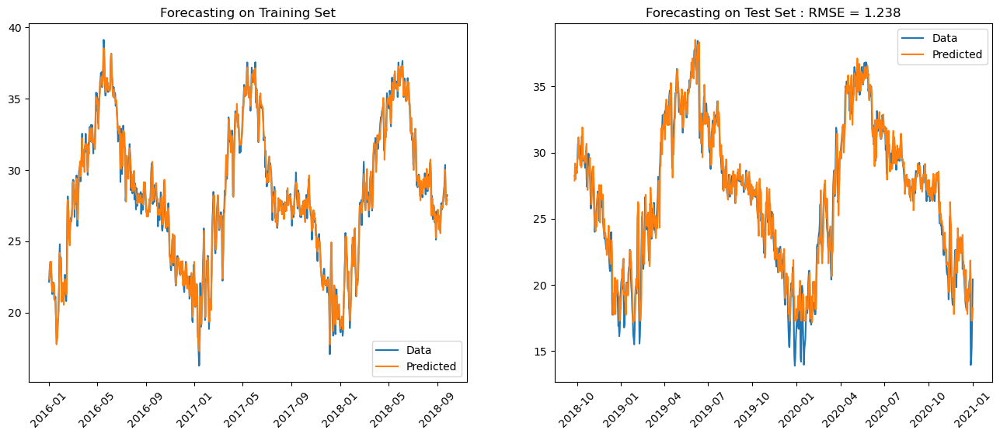

In [249]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['T2M'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['T2M'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

This prediction is quite similar to the one obtained with Linear Regression, also notice the value of the rmse are very similar

In [250]:
from joblib import dump
dump(rf_model, 'models\Ahmadabad_temperature.joblib')

['models\\Ahmadabad_temperature.joblib']

## Humidity

In [258]:
df = df.drop("T2M",axis = 1)

In [259]:
train_data = df.iloc[:1000]  # First 1000 rows for training
test_data = df.iloc[1000:]

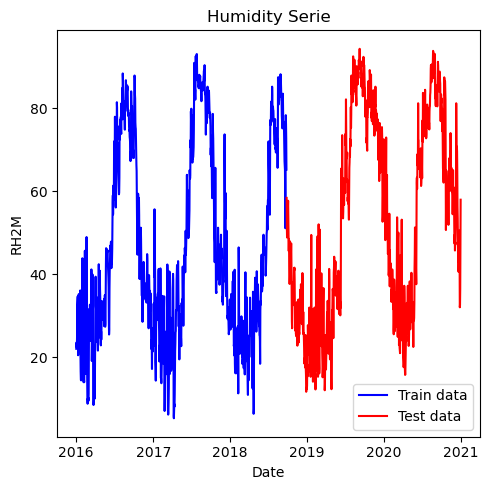

In [260]:
#plot the train and test data we have preparated

plt.figure(figsize=(5,5))
sns.lineplot(df['RH2M'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['RH2M'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df[::100]
# plt.xticks(selected_dates, rotation=45)
plt.title('Humidity Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [261]:
#check if it is a time series by looking at the autocorrelation
print(df['RH2M'].autocorr())

0.9723813816648499


In [262]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['RH2M'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,RH2M,Yesterday
Date,,
2016-01-02,23.56,22.06
2016-01-03,23.12,23.56
2016-01-04,22.38,23.12
2016-01-05,25.56,22.38
2016-01-06,32.69,25.56


In [263]:
train_data

,RH2M
Date,
2016-01-01,22.06
2016-01-02,23.56
2016-01-03,23.12
2016-01-04,22.38
2016-01-05,25.56
...,...
2018-09-22,68.62
2018-09-23,78.38
2018-09-24,76.19


In [264]:
y = daily_climate_['RH2M']
X = daily_climate_['Yesterday']

In [265]:
X_train = X[: '2018-09-26']
X_test = X ['2018-09-26':]
y_train = y[:'2018-09-26']
y_test = y['2018-09-26':]

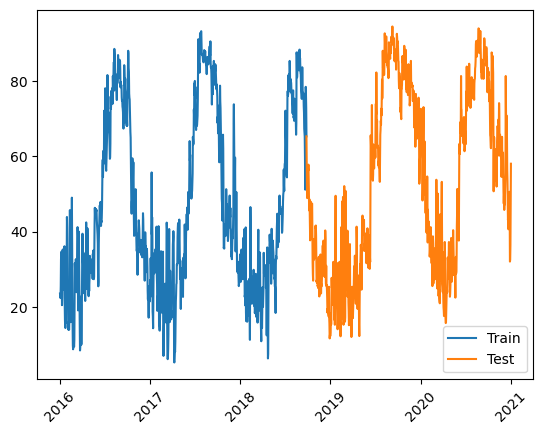

In [266]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [267]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

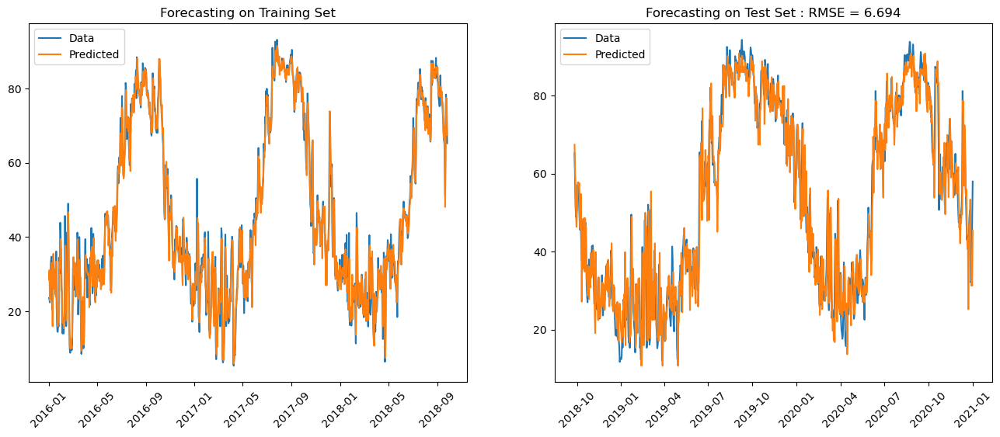

In [268]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['RH2M'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['RH2M'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [269]:
from joblib import dump
dump(rf_model, 'models\Ahmadabad_humidity.joblib')

['models\\Ahmadabad_humidity.joblib']

# **Hyderabad**

## Temperature

In [291]:
import pandas as pd
df  = pd.read_csv("datas/hyderabad_weather.csv")

In [292]:
df = df.drop("Unnamed: 0",axis =1)

In [293]:
df

,T2M,RH2M,Date
0,22.70,47.62,2016-01-01
1,22.95,42.12,2016-01-02
2,22.51,33.94,2016-01-03
3,21.76,38.06,2016-01-04
4,21.95,40.94,2016-01-05
...,...,...,...
1882,25.58,32.31,2021-02-25
1883,26.51,28.50,2021-02-26
1884,26.36,29.94,2021-02-27
1885,26.61,26.25,2021-02-28


In [294]:
#convert date as a DateTime object
df['Date']=pd.to_datetime(df['Date'])

In [295]:
df

,T2M,RH2M,Date
0,22.70,47.62,2016-01-01
1,22.95,42.12,2016-01-02
2,22.51,33.94,2016-01-03
3,21.76,38.06,2016-01-04
4,21.95,40.94,2016-01-05
...,...,...,...
1882,25.58,32.31,2021-02-25
1883,26.51,28.50,2021-02-26
1884,26.36,29.94,2021-02-27
1885,26.61,26.25,2021-02-28


In [296]:
#set date as the key of the dataset
df.set_index(df['Date'], inplace=True)
df = df.drop('Date', axis=1)
df.head()

,T2M,RH2M
Date,,
2016-01-01,22.70,47.62
2016-01-02,22.95,42.12
2016-01-03,22.51,33.94
2016-01-04,21.76,38.06
2016-01-05,21.95,40.94


In [297]:
df

,T2M,RH2M
Date,,
2016-01-01,22.70,47.62
2016-01-02,22.95,42.12
2016-01-03,22.51,33.94
2016-01-04,21.76,38.06
2016-01-05,21.95,40.94
...,...,...
2021-02-25,25.58,32.31
2021-02-26,26.51,28.50
2021-02-27,26.36,29.94


In [278]:
#focus only on the temperature
df = df.drop(['RH2M'], axis=1)
df.head()

,T2M
Date,
2016-01-01,22.70
2016-01-02,22.95
2016-01-03,22.51
2016-01-04,21.76
2016-01-05,21.95


In [279]:
df[:100]

,T2M
Date,
2016-01-01,22.70
2016-01-02,22.95
2016-01-03,22.51
2016-01-04,21.76
2016-01-05,21.95
...,...
2016-04-05,32.32
2016-04-06,31.90
2016-04-07,31.78


In [280]:
train_data = df.iloc[:1000]  # First 1000 rows for training
test_data = df.iloc[1000:]

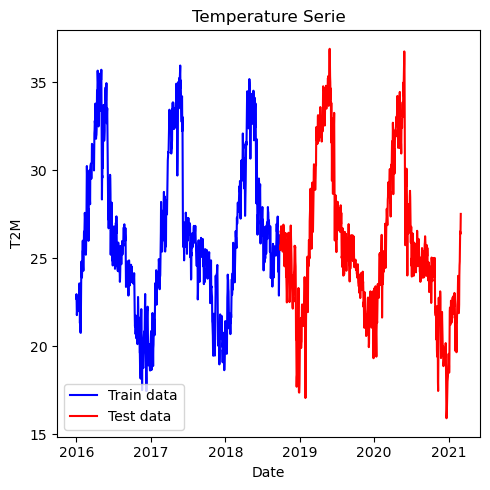

In [281]:
#plot the train and test data we have preparated

plt.figure(figsize=(5,5))
sns.lineplot(df['T2M'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['T2M'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df[::100]
# plt.xticks(selected_dates, rotation=45)
plt.title('Temperature Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [282]:
#check if it is a time series by looking at the autocorrelation
print(df['T2M'].autocorr())

0.9805714763370608


In [283]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['T2M'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,T2M,Yesterday
Date,,
2016-01-02,22.95,22.70
2016-01-03,22.51,22.95
2016-01-04,21.76,22.51
2016-01-05,21.95,21.76
2016-01-06,22.22,21.95


In [284]:
train_data

,T2M
Date,
2016-01-01,22.70
2016-01-02,22.95
2016-01-03,22.51
2016-01-04,21.76
2016-01-05,21.95
...,...
2018-09-22,24.40
2018-09-23,25.38
2018-09-24,25.57


In [285]:
y = daily_climate_['T2M']
X = daily_climate_['Yesterday']

In [286]:
X_train = X[: '2018-09-26']
X_test = X ['2018-09-26':]
y_train = y[:'2018-09-26']
y_test = y['2018-09-26':]

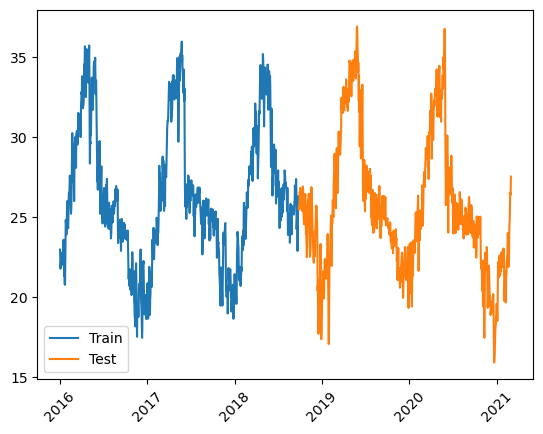

In [287]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [288]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

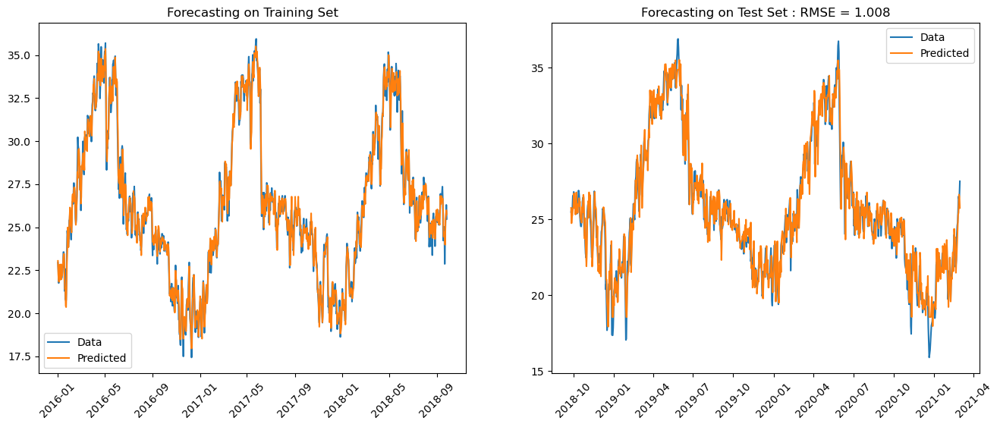

In [289]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['T2M'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['T2M'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [290]:
from joblib import dump
dump(rf_model, 'models\Hyderabad_temperature.joblib')

['models\\Hyderabad_temperature.joblib']

## Humidity

In [298]:
df = df.drop("T2M",axis = 1)

In [299]:
df

,RH2M
Date,
2016-01-01,47.62
2016-01-02,42.12
2016-01-03,33.94
2016-01-04,38.06
2016-01-05,40.94
...,...
2021-02-25,32.31
2021-02-26,28.50
2021-02-27,29.94


In [300]:
train_data = df.iloc[:1000]  # First 1000 rows for training
test_data = df.iloc[1000:]

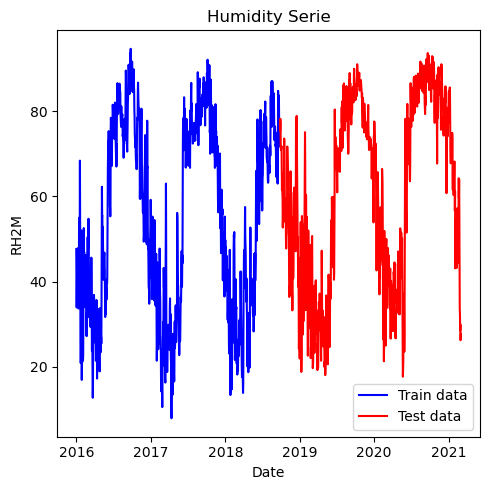

In [301]:
#plot the train and test data we have preparated

plt.figure(figsize=(5,5))
sns.lineplot(df['RH2M'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['RH2M'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df[::100]
# plt.xticks(selected_dates, rotation=45)
plt.title('Humidity Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [302]:
#check if it is a time series by looking at the autocorrelation
print(df['RH2M'].autocorr())

0.9678385839711037


In [303]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['RH2M'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,RH2M,Yesterday
Date,,
2016-01-02,42.12,47.62
2016-01-03,33.94,42.12
2016-01-04,38.06,33.94
2016-01-05,40.94,38.06
2016-01-06,47.25,40.94


In [304]:
train_data

,RH2M
Date,
2016-01-01,47.62
2016-01-02,42.12
2016-01-03,33.94
2016-01-04,38.06
2016-01-05,40.94
...,...
2018-09-22,76.94
2018-09-23,71.69
2018-09-24,74.56


In [305]:
y = daily_climate_['RH2M']
X = daily_climate_['Yesterday']

In [306]:
X_train = X[: '2018-09-26']
X_test = X ['2018-09-26':]
y_train = y[:'2018-09-26']
y_test = y['2018-09-26':]

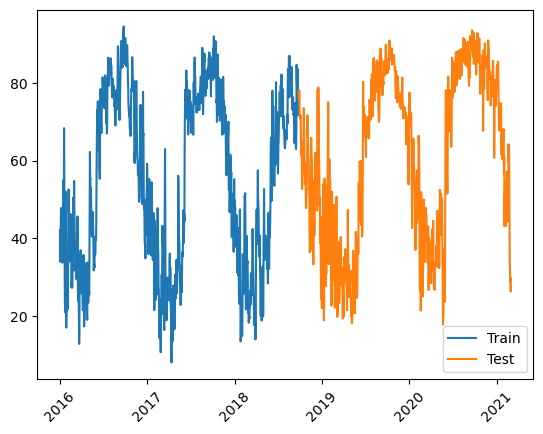

In [307]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [308]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

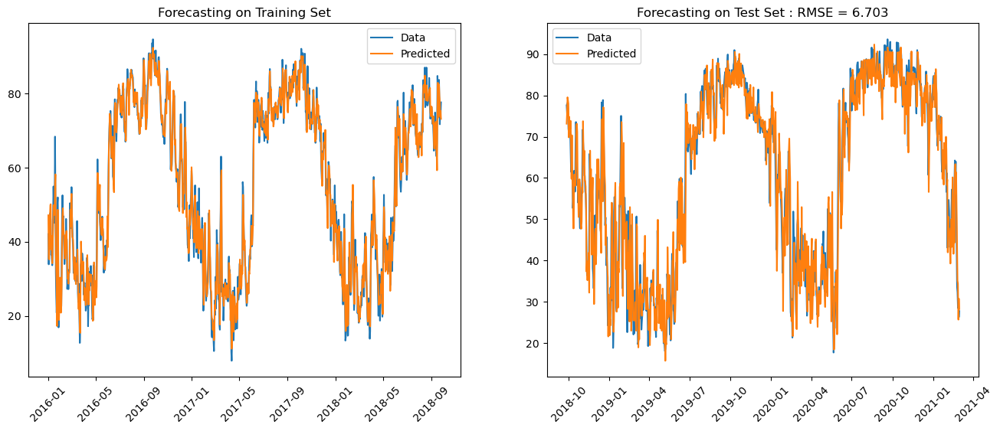

In [309]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['RH2M'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['RH2M'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [310]:
dump(rf_model, 'models\Hyderabad_humidity.joblib')

['models\\Hyderabad_humidity.joblib']

# **Chennai**

## Humidity

In [332]:
df = pd.read_csv("datas/chennai_weather.csv")

In [333]:
df

,Unnamed: 0,T2M,RH2M,Date
0,0,23.73,76.62,2016-01-01
1,1,23.50,77.00,2016-01-02
2,2,23.52,76.88,2016-01-03
3,3,23.78,76.56,2016-01-04
4,4,23.73,75.75,2016-01-05
...,...,...,...,...
1882,1882,25.21,70.81,2021-02-25
1883,1883,25.26,71.56,2021-02-26
1884,1884,25.35,76.25,2021-02-27
1885,1885,25.31,77.25,2021-02-28


In [334]:
df = df.drop("Unnamed: 0",axis = 1)

In [315]:
#convert date as a DateTime object
df['Date']=pd.to_datetime(df['Date'])

In [316]:
df

,T2M,RH2M,Date
0,23.73,76.62,2016-01-01
1,23.50,77.00,2016-01-02
2,23.52,76.88,2016-01-03
3,23.78,76.56,2016-01-04
4,23.73,75.75,2016-01-05
...,...,...,...
1882,25.21,70.81,2021-02-25
1883,25.26,71.56,2021-02-26
1884,25.35,76.25,2021-02-27
1885,25.31,77.25,2021-02-28


In [317]:
#set date as the key of the dataset
df.set_index(df['Date'], inplace=True)
df = df.drop('Date', axis=1)
df.head()

,T2M,RH2M
Date,,
2016-01-01,23.73,76.62
2016-01-02,23.50,77.00
2016-01-03,23.52,76.88
2016-01-04,23.78,76.56
2016-01-05,23.73,75.75


In [318]:
df

,T2M,RH2M
Date,,
2016-01-01,23.73,76.62
2016-01-02,23.50,77.00
2016-01-03,23.52,76.88
2016-01-04,23.78,76.56
2016-01-05,23.73,75.75
...,...,...
2021-02-25,25.21,70.81
2021-02-26,25.26,71.56
2021-02-27,25.35,76.25


In [319]:
#focus only on the temperature
df = df.drop(['T2M'], axis=1)
df.head()

,RH2M
Date,
2016-01-01,76.62
2016-01-02,77.00
2016-01-03,76.88
2016-01-04,76.56
2016-01-05,75.75


In [320]:
df[:100]

,RH2M
Date,
2016-01-01,76.62
2016-01-02,77.00
2016-01-03,76.88
2016-01-04,76.56
2016-01-05,75.75
...,...
2016-04-05,62.69
2016-04-06,63.94
2016-04-07,65.62


In [321]:
train_data = df.iloc[:1000]  # First 1000 rows for training
test_data = df.iloc[1000:]

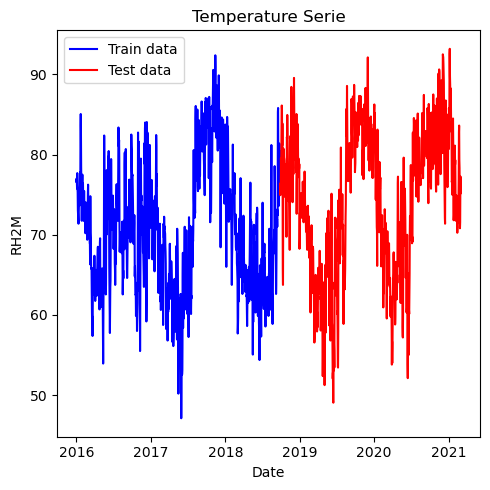

In [322]:
#plot the train and test data we have preparated

plt.figure(figsize=(5,5))
sns.lineplot(df['RH2M'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['RH2M'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df[::100]
# plt.xticks(selected_dates, rotation=45)
plt.title('Temperature Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [323]:
#check if it is a time series by looking at the autocorrelation
print(df['RH2M'].autocorr())

0.9175176512687996


In [324]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['RH2M'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,RH2M,Yesterday
Date,,
2016-01-02,77.00,76.62
2016-01-03,76.88,77.00
2016-01-04,76.56,76.88
2016-01-05,75.75,76.56
2016-01-06,77.69,75.75


In [325]:
train_data

,RH2M
Date,
2016-01-01,76.62
2016-01-02,77.00
2016-01-03,76.88
2016-01-04,76.56
2016-01-05,75.75
...,...
2018-09-22,76.88
2018-09-23,81.38
2018-09-24,78.06


In [326]:
y = daily_climate_['RH2M']
X = daily_climate_['Yesterday']

In [327]:
X_train = X[: '2018-09-26']
X_test = X ['2018-09-26':]
y_train = y[:'2018-09-26']
y_test = y['2018-09-26':]

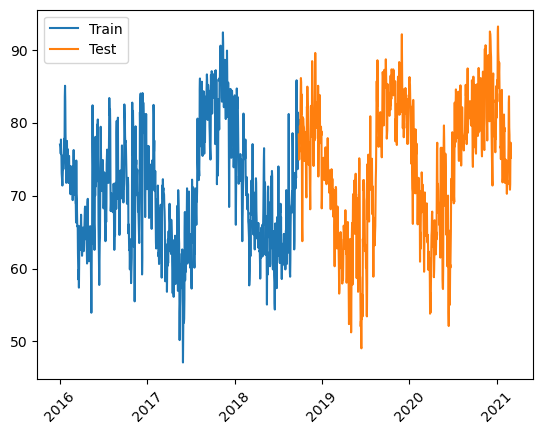

In [328]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [329]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

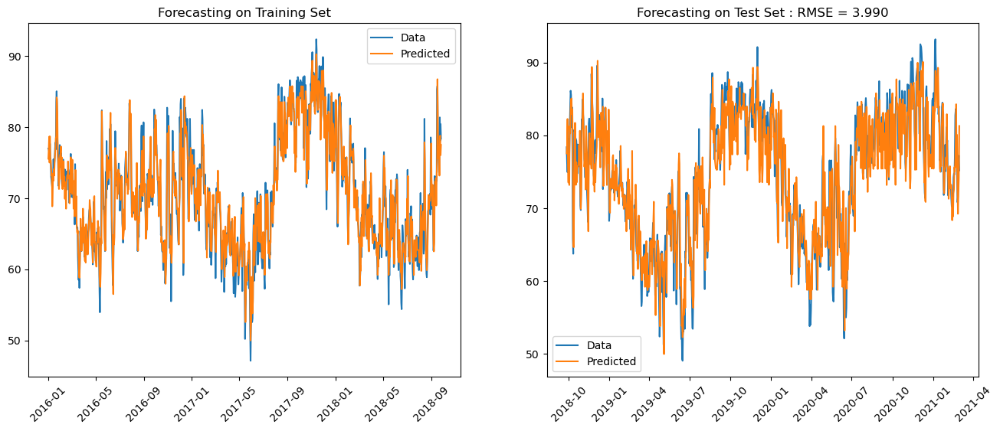

In [330]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['RH2M'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['RH2M'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [331]:
from joblib import dump
dump(rf_model, 'models\Chennai_humidity.joblib')

['models\\Chennai_humidity.joblib.joblib']

## Temperature

In [335]:
#convert date as a DateTime object
df['Date']=pd.to_datetime(df['Date'])

In [336]:
df

,T2M,RH2M,Date
0,23.73,76.62,2016-01-01
1,23.50,77.00,2016-01-02
2,23.52,76.88,2016-01-03
3,23.78,76.56,2016-01-04
4,23.73,75.75,2016-01-05
...,...,...,...
1882,25.21,70.81,2021-02-25
1883,25.26,71.56,2021-02-26
1884,25.35,76.25,2021-02-27
1885,25.31,77.25,2021-02-28


In [337]:
#set date as the key of the dataset
df.set_index(df['Date'], inplace=True)
df = df.drop('Date', axis=1)
df.head()

,T2M,RH2M
Date,,
2016-01-01,23.73,76.62
2016-01-02,23.50,77.00
2016-01-03,23.52,76.88
2016-01-04,23.78,76.56
2016-01-05,23.73,75.75


In [338]:
df

,T2M,RH2M
Date,,
2016-01-01,23.73,76.62
2016-01-02,23.50,77.00
2016-01-03,23.52,76.88
2016-01-04,23.78,76.56
2016-01-05,23.73,75.75
...,...,...
2021-02-25,25.21,70.81
2021-02-26,25.26,71.56
2021-02-27,25.35,76.25


In [339]:
#focus only on the temperature
df = df.drop(['RH2M'], axis=1)
df.head()

,T2M
Date,
2016-01-01,23.73
2016-01-02,23.50
2016-01-03,23.52
2016-01-04,23.78
2016-01-05,23.73


In [340]:
df[:100]

,T2M
Date,
2016-01-01,23.73
2016-01-02,23.50
2016-01-03,23.52
2016-01-04,23.78
2016-01-05,23.73
...,...
2016-04-05,30.36
2016-04-06,30.73
2016-04-07,31.06


In [341]:
train_data = df.iloc[:1000]  # First 1000 rows for training
test_data = df.iloc[1000:]

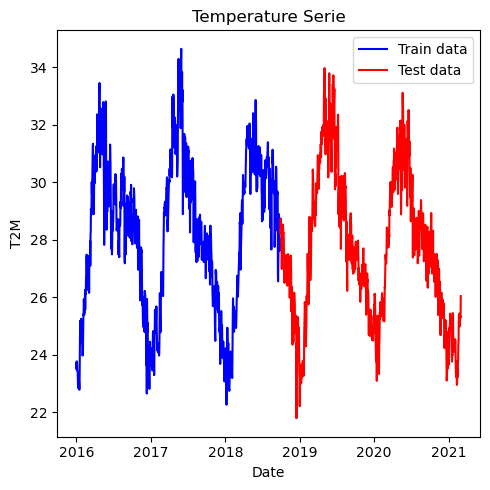

In [342]:
#plot the train and test data we have preparated

plt.figure(figsize=(5,5))
sns.lineplot(df['T2M'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['T2M'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df[::100]
# plt.xticks(selected_dates, rotation=45)
plt.title('Temperature Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [343]:
#check if it is a time series by looking at the autocorrelation
print(df['T2M'].autocorr())

0.9748521215256093


In [344]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['T2M'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,T2M,Yesterday
Date,,
2016-01-02,23.50,23.73
2016-01-03,23.52,23.50
2016-01-04,23.78,23.52
2016-01-05,23.73,23.78
2016-01-06,23.46,23.73


In [345]:
train_data

,T2M
Date,
2016-01-01,23.73
2016-01-02,23.50
2016-01-03,23.52
2016-01-04,23.78
2016-01-05,23.73
...,...
2018-09-22,28.56
2018-09-23,27.80
2018-09-24,28.05


In [346]:
y = daily_climate_['T2M']
X = daily_climate_['Yesterday']

In [347]:
X_train = X[: '2018-09-26']
X_test = X ['2018-09-26':]
y_train = y[:'2018-09-26']
y_test = y['2018-09-26':]

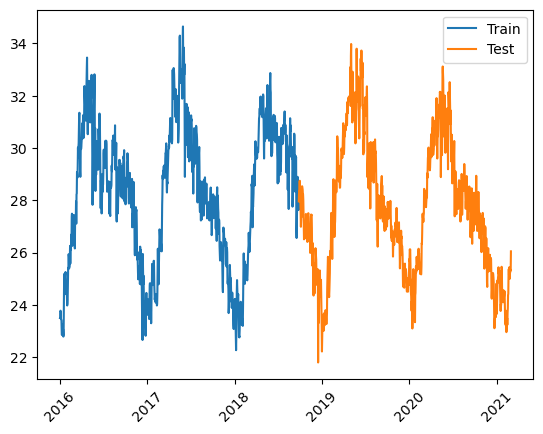

In [348]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [349]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

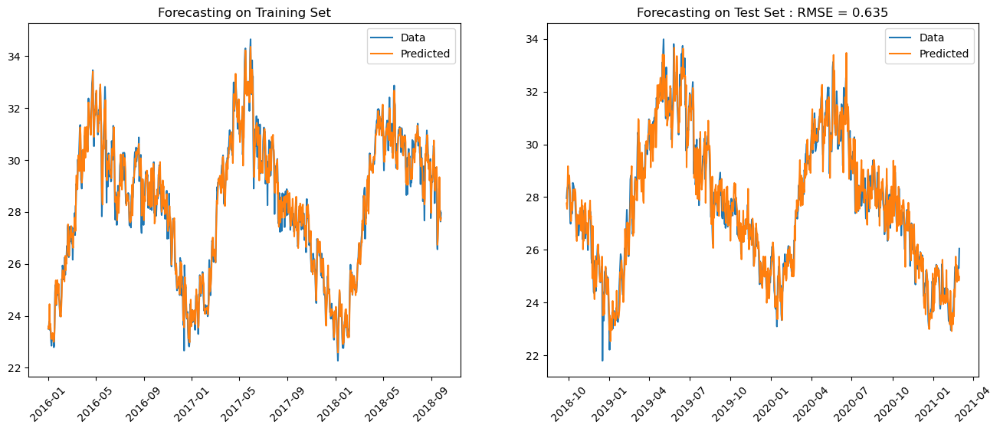

In [350]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['T2M'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend()

plt.subplot(1,2,2)
plt.plot(df_result_test['T2M'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [352]:
from joblib import dump
dump(rf_model, 'models\Chennai_temperature.joblib')

['models\\Chennai_temperature.joblib']

# **Bhubaneshwar**

## Temperature

In [534]:
df = pd.read_csv("datas/Bhubaneshwar.csv")

In [535]:
df = df.drop("Unnamed: 0",axis = 1)

In [536]:
df = df.drop("RH2M",axis = 1)

In [537]:
df['Date']=pd.to_datetime(df['Date'])

In [538]:
df.set_index(df['Date'], inplace=True)
df = df.drop('Date', axis=1)
df.head()

,T2M
Date,
2016-01-01,21.53
2016-01-02,21.90
2016-01-03,21.70
2016-01-04,20.76
2016-01-05,21.30


In [539]:
train_data = df.iloc[:1000]  # First 1000 rows for training
test_data = df.iloc[1000:]

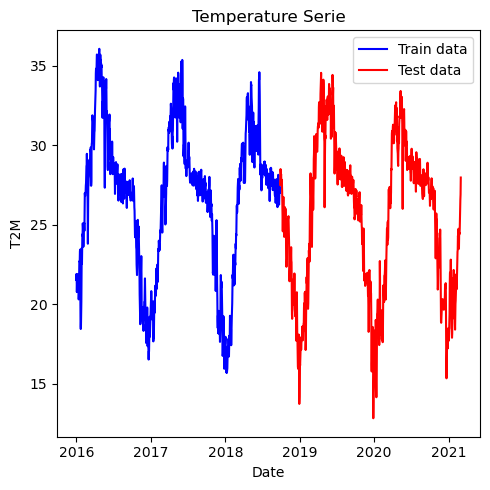

In [540]:
#plot the train and test data we have preparated

plt.figure(figsize=(5,5))
sns.lineplot(df['T2M'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['T2M'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df[::100]
# plt.xticks(selected_dates, rotation=45)
plt.title('Temperature Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [541]:
#check if it is a time series by looking at the autocorrelation
print(df['T2M'].autocorr())

0.9856201935942303


In [542]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['T2M'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,T2M,Yesterday
Date,,
2016-01-02,21.90,21.53
2016-01-03,21.70,21.90
2016-01-04,20.76,21.70
2016-01-05,21.30,20.76
2016-01-06,20.99,21.30


In [543]:
train_data

,T2M
Date,
2016-01-01,21.53
2016-01-02,21.90
2016-01-03,21.70
2016-01-04,20.76
2016-01-05,21.30
...,...
2018-09-22,26.26
2018-09-23,26.79
2018-09-24,27.40


In [544]:
y = daily_climate_['T2M']
X = daily_climate_['Yesterday']

In [545]:
X_train = X[: '2018-09-26']
X_test = X ['2018-09-26':]
y_train = y[:'2018-09-26']
y_test = y['2018-09-26':]

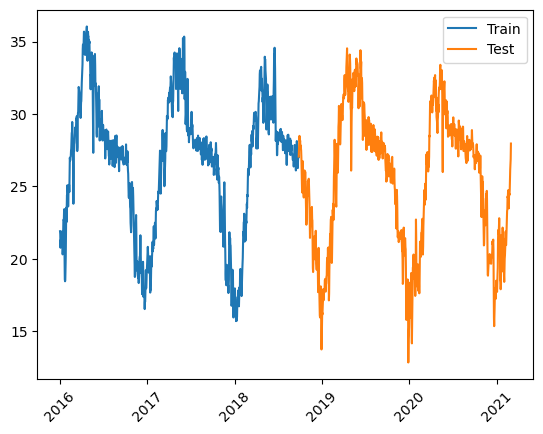

In [546]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [547]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

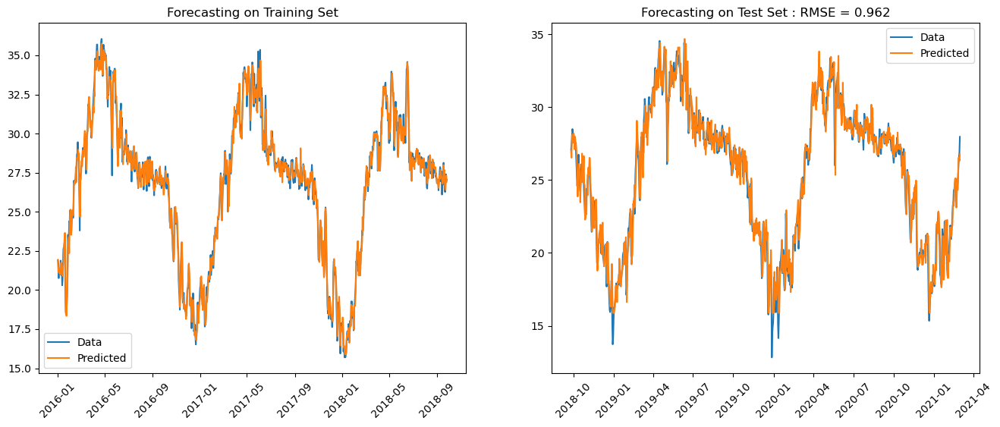

In [548]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['T2M'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['T2M'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [549]:
from joblib import dump
dump(rf_model, 'models\Bhubhaneshwar_temperature.joblib')

['models\\Bhubhaneshwar_temperature.joblib']

## Humidity

In [374]:
df = df.drop("T2M",axis = 1)

,RH2M
Date,
2016-01-01,61.50
2016-01-02,66.44
2016-01-03,65.75
2016-01-04,56.12
2016-01-05,65.81
...,...
2021-02-25,35.62
2021-02-26,36.44
2021-02-27,35.12


In [377]:
train_data = df.iloc[:1000]  # First 1000 rows for training
test_data = df.iloc[1000:]

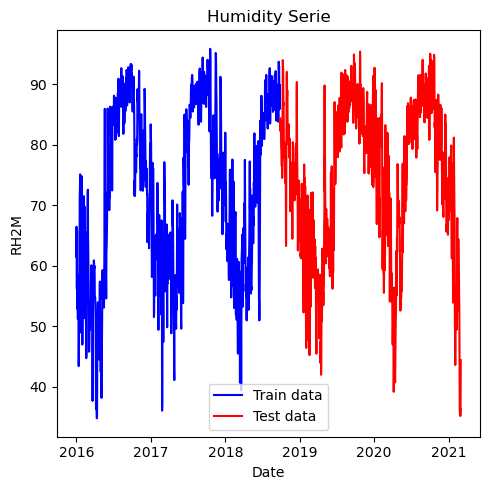

In [378]:
#plot the train and test data we have preparated

plt.figure(figsize=(5,5))
sns.lineplot(df['RH2M'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['RH2M'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df[::100]
# plt.xticks(selected_dates, rotation=45)
plt.title('Humidity Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [379]:
#check if it is a time series by looking at the autocorrelation
print(df['RH2M'].autocorr())

0.9385638050104904


In [380]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['RH2M'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,RH2M,Yesterday
Date,,
2016-01-02,66.44,61.50
2016-01-03,65.75,66.44
2016-01-04,56.12,65.75
2016-01-05,65.81,56.12
2016-01-06,52.88,65.81


In [381]:
train_data

,RH2M
Date,
2016-01-01,61.50
2016-01-02,66.44
2016-01-03,65.75
2016-01-04,56.12
2016-01-05,65.81
...,...
2018-09-22,93.00
2018-09-23,88.69
2018-09-24,85.88


In [382]:
y = daily_climate_['RH2M']
X = daily_climate_['Yesterday']

In [383]:
X_train = X[: '2018-09-26']
X_test = X ['2018-09-26':]
y_train = y[:'2018-09-26']
y_test = y['2018-09-26':]

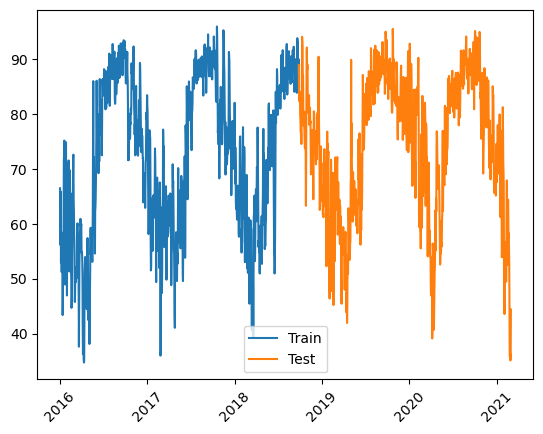

In [384]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [385]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

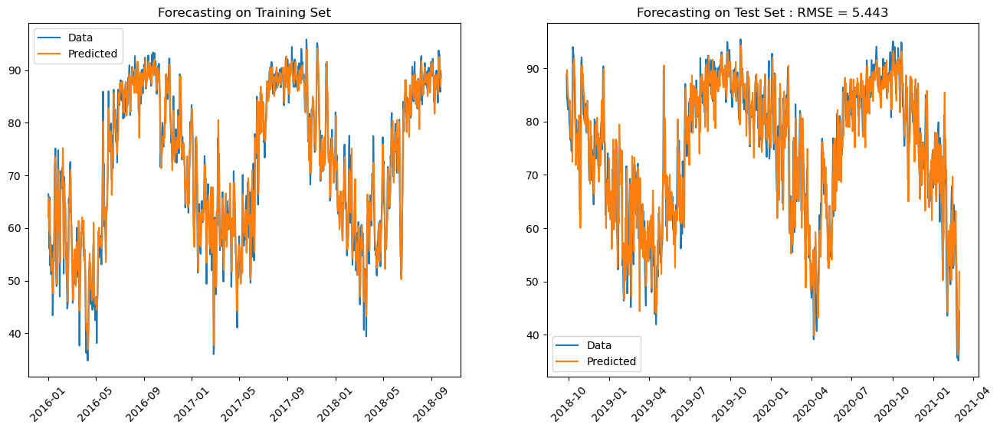

In [386]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['RH2M'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['RH2M'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [387]:
from joblib import dump
dump(rf_model, 'models\Bhubhneshwar_humidity.joblib')

['models\\Bhubhneshwar_humidity.joblib']

# **Lucknow**

## Temperature

In [406]:
df = pd.read_csv("datas/Lucknow_weather.csv")

In [407]:
df = df.drop("Unnamed: 0",axis = 1)

In [391]:
df['Date']=pd.to_datetime(df['Date'])

In [392]:
df.set_index(df['Date'], inplace=True)
df = df.drop('Date', axis=1)
df.head()

,T2M,RH2M
Date,,
2016-01-01,18.51,21.25
2016-01-02,17.19,21.38
2016-01-03,16.22,20.69
2016-01-04,17.49,21.81
2016-01-05,20.12,23.31


In [393]:
df = df.drop("RH2M",axis =1)

In [394]:
df

,T2M
Date,
2016-01-01,18.51
2016-01-02,17.19
2016-01-03,16.22
2016-01-04,17.49
2016-01-05,20.12
...,...
2021-02-25,24.73
2021-02-26,25.03
2021-02-27,26.30


In [395]:
train_data = df.iloc[:1000]  # First 1000 rows for training
test_data = df.iloc[1000:]

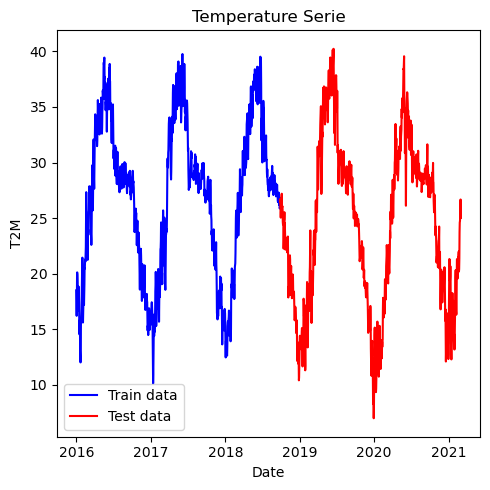

In [396]:
#plot the train and test data we have preparated

plt.figure(figsize=(5,5))
sns.lineplot(df['T2M'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['T2M'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df[::100]
# plt.xticks(selected_dates, rotation=45)
plt.title('Temperature Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [397]:
#check if it is a time series by looking at the autocorrelation
print(df['T2M'].autocorr())

0.9878059785159146


In [398]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['T2M'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,T2M,Yesterday
Date,,
2016-01-02,17.19,18.51
2016-01-03,16.22,17.19
2016-01-04,17.49,16.22
2016-01-05,20.12,17.49
2016-01-06,20.12,20.12


In [399]:
train_data

,T2M
Date,
2016-01-01,18.51
2016-01-02,17.19
2016-01-03,16.22
2016-01-04,17.49
2016-01-05,20.12
...,...
2018-09-22,26.19
2018-09-23,26.56
2018-09-24,26.89


In [400]:
y = daily_climate_['T2M']
X = daily_climate_['Yesterday']

In [401]:
X_train = X[: '2018-09-26']
X_test = X ['2018-09-26':]
y_train = y[:'2018-09-26']
y_test = y['2018-09-26':]

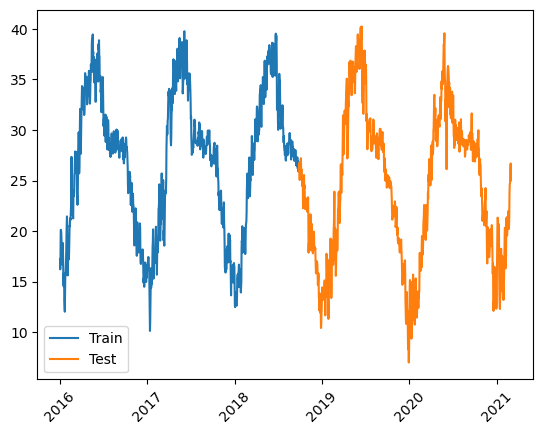

In [402]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [403]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

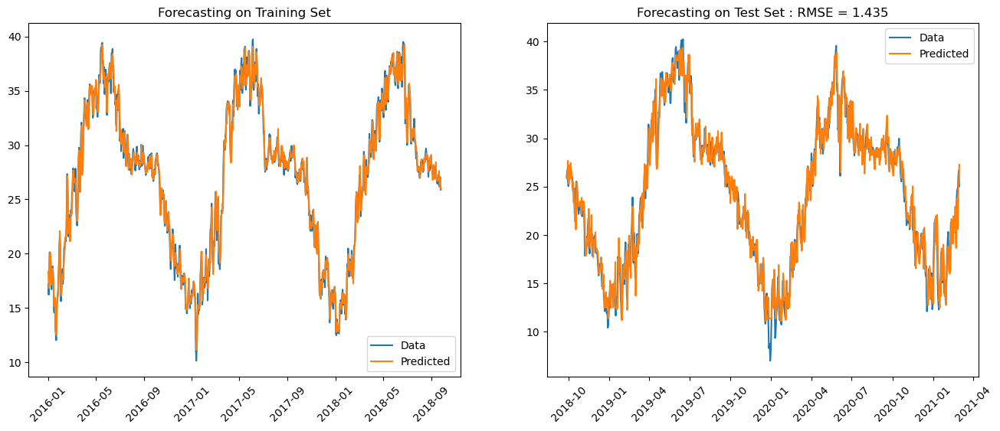

In [404]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['T2M'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['T2M'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [405]:
from joblib import dump
dump(rf_model, 'models\Lucknow_temmperature.joblib')

['models\\Lucknow_temmperature.joblib']

## Humidity

In [408]:
df['Date']=pd.to_datetime(df['Date'])

In [409]:
df.set_index(df['Date'], inplace=True)
df = df.drop('Date', axis=1)
df.head()

,T2M,RH2M
Date,,
2016-01-01,18.51,21.25
2016-01-02,17.19,21.38
2016-01-03,16.22,20.69
2016-01-04,17.49,21.81
2016-01-05,20.12,23.31


In [410]:
df = df.drop("T2M",axis = 1)

In [411]:
df

,RH2M
Date,
2016-01-01,21.25
2016-01-02,21.38
2016-01-03,20.69
2016-01-04,21.81
2016-01-05,23.31
...,...
2021-02-25,21.00
2021-02-26,24.38
2021-02-27,25.94


In [412]:
train_data = df.iloc[:1000]  # First 1000 rows for training
test_data = df.iloc[1000:]

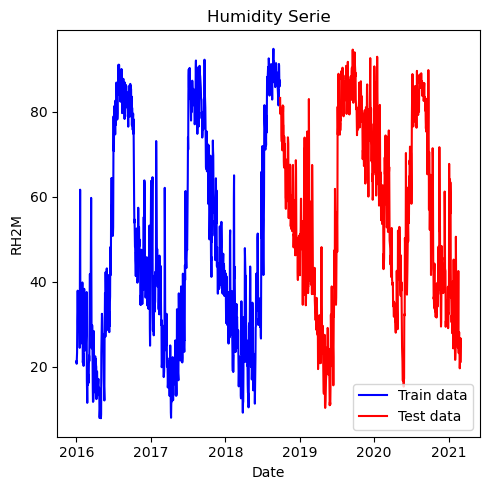

In [413]:
#plot the train and test data we have preparated

plt.figure(figsize=(5,5))
sns.lineplot(df['RH2M'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['RH2M'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df[::100]
# plt.xticks(selected_dates, rotation=45)
plt.title('Humidity Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [414]:
#check if it is a time series by looking at the autocorrelation
print(df['RH2M'].autocorr())

0.9695347406242323


In [415]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['RH2M'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,RH2M,Yesterday
Date,,
2016-01-02,21.38,21.25
2016-01-03,20.69,21.38
2016-01-04,21.81,20.69
2016-01-05,23.31,21.81
2016-01-06,30.62,23.31


In [416]:
train_data

,RH2M
Date,
2016-01-01,21.25
2016-01-02,21.38
2016-01-03,20.69
2016-01-04,21.81
2016-01-05,23.31
...,...
2018-09-22,90.81
2018-09-23,87.19
2018-09-24,85.88


In [417]:
y = daily_climate_['RH2M']
X = daily_climate_['Yesterday']

In [418]:
X_train = X[: '2018-09-26']
X_test = X ['2018-09-26':]
y_train = y[:'2018-09-26']
y_test = y['2018-09-26':]

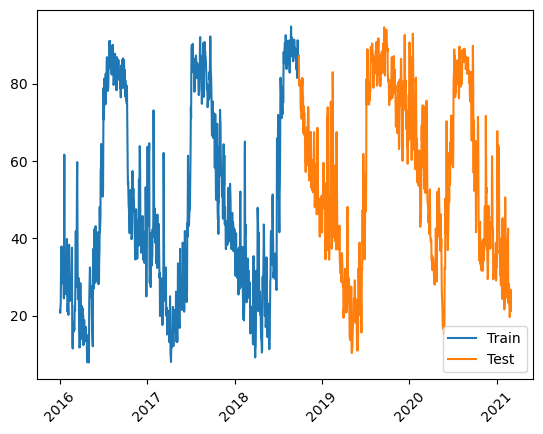

In [419]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [420]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

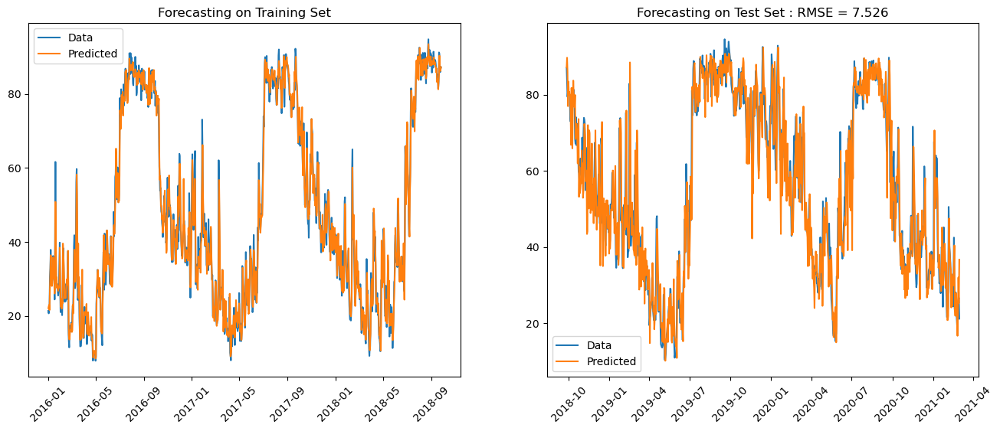

In [421]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['RH2M'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['RH2M'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [422]:
from joblib import dump
dump(rf_model, 'models\Lucknow_humidity.joblib')

['models\\Lucknow_humidity.joblib']

# **Patna**

## Temperature

In [442]:
df = pd.read_csv("datas/patna_weather.csv")

In [443]:
df = df.drop("Unnamed: 0",axis = 1)

In [444]:
df

,T2M,RH2M,Date
0,17.27,84.56,2016-01-01
1,17.75,64.50,2016-01-02
2,17.77,53.38,2016-01-03
3,17.25,54.00,2016-01-04
4,15.88,51.00,2016-01-05
...,...,...,...
1882,20.52,41.81,2021-02-25
1883,20.68,43.44,2021-02-26
1884,20.71,39.94,2021-02-27
1885,20.94,37.25,2021-02-28


In [445]:
df.set_index(df['Date'], inplace=True)
df = df.drop('Date', axis=1)
df.head()

,T2M,RH2M
Date,,
2016-01-01,17.27,84.56
2016-01-02,17.75,64.50
2016-01-03,17.77,53.38
2016-01-04,17.25,54.00
2016-01-05,15.88,51.00


In [429]:
df = df.drop("RH2M",axis = 1)

In [430]:
df

,T2M
Date,
2016-01-01,17.27
2016-01-02,17.75
2016-01-03,17.77
2016-01-04,17.25
2016-01-05,15.88
...,...
2021-02-25,20.52
2021-02-26,20.68
2021-02-27,20.71


In [431]:
train_data = df.iloc[:1000]  # First 1000 rows for training
test_data = df.iloc[1000:]

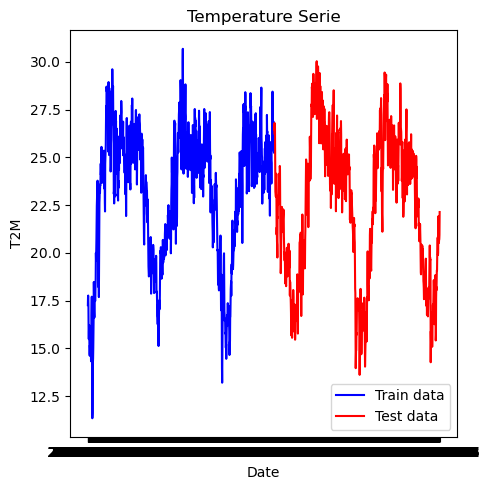

In [432]:
#plot the train and test data we have preparated

plt.figure(figsize=(5,5))
sns.lineplot(df['T2M'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['T2M'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df[::100]
# plt.xticks(selected_dates, rotation=45)
plt.title('Temperature Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [433]:
#check if it is a time series by looking at the autocorrelation
print(df['T2M'].autocorr())

0.9653407866684252


In [434]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['T2M'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,T2M,Yesterday
Date,,
2016-01-02,17.75,17.27
2016-01-03,17.77,17.75
2016-01-04,17.25,17.77
2016-01-05,15.88,17.25
2016-01-06,15.49,15.88


In [435]:
train_data

,T2M
Date,
2016-01-01,17.27
2016-01-02,17.75
2016-01-03,17.77
2016-01-04,17.25
2016-01-05,15.88
...,...
2018-09-22,26.87
2018-09-23,26.07
2018-09-24,25.69


In [436]:
y = daily_climate_['T2M']
X = daily_climate_['Yesterday']

In [437]:
X_train = X[: '2018-09-26']
X_test = X ['2018-09-26':]
y_train = y[:'2018-09-26']
y_test = y['2018-09-26':]

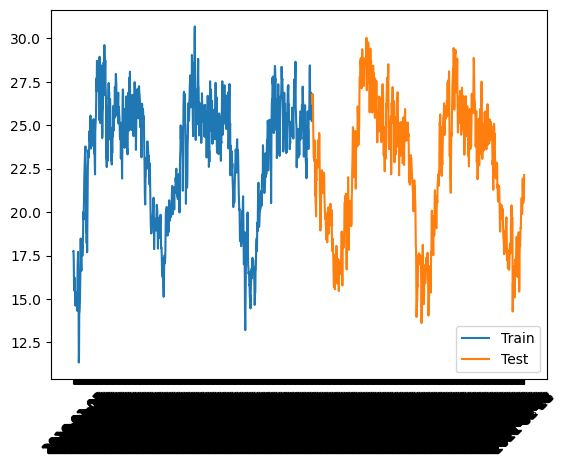

In [438]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [439]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

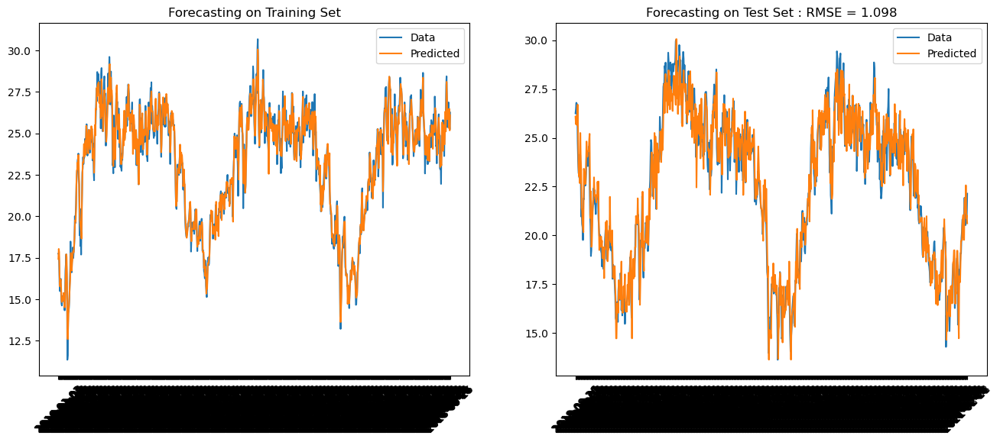

In [440]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['T2M'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['T2M'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [441]:
from joblib import dump
dump(rf_model, 'models\Patna_temperature.joblib')

['models\\Patna_temperature.joblib']

## Humidity

In [446]:
df = df.drop("T2M",axis= 1)

In [447]:
df

,RH2M
Date,
2016-01-01,84.56
2016-01-02,64.50
2016-01-03,53.38
2016-01-04,54.00
2016-01-05,51.00
...,...
2021-02-25,41.81
2021-02-26,43.44
2021-02-27,39.94


In [448]:
train_data = df.iloc[:1000]  # First 1000 rows for training
test_data = df.iloc[1000:]

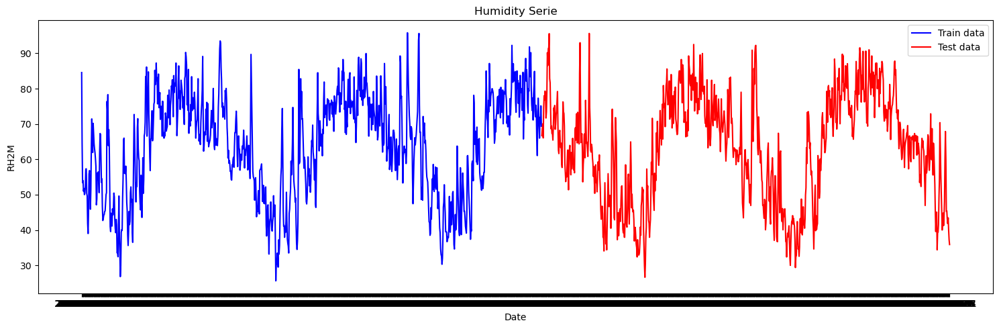

In [449]:
#plot the train and test data we have preparated

plt.figure(figsize=(15,5))
sns.lineplot(df['RH2M'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['RH2M'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df[::100]
# plt.xticks(selected_dates, rotation=45)
plt.title('Humidity Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [450]:
#check if it is a time series by looking at the autocorrelation
print(df['RH2M'].autocorr())

0.9133437830734652


In [451]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['RH2M'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,RH2M,Yesterday
Date,,
2016-01-02,64.50,84.56
2016-01-03,53.38,64.50
2016-01-04,54.00,53.38
2016-01-05,51.00,54.00
2016-01-06,51.75,51.00


In [452]:
train_data

,RH2M
Date,
2016-01-01,84.56
2016-01-02,64.50
2016-01-03,53.38
2016-01-04,54.00
2016-01-05,51.00
...,...
2018-09-22,66.00
2018-09-23,71.88
2018-09-24,70.12


In [453]:
y = daily_climate_['RH2M']
X = daily_climate_['Yesterday']

In [454]:
X_train = X[: '2018-09-26']
X_test = X ['2018-09-26':]
y_train = y[:'2018-09-26']
y_test = y['2018-09-26':]

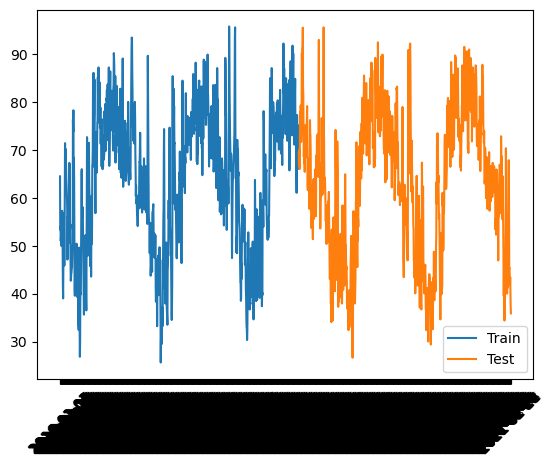

In [455]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [456]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

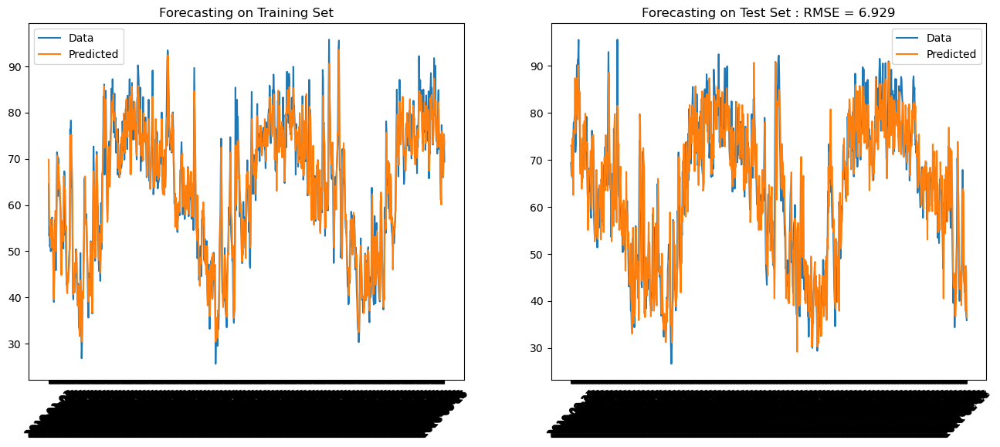

In [457]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['RH2M'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['RH2M'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [458]:
from joblib import dump
dump(rf_model, 'models\Patna_humidity.joblib')

['models\\Patna_humidity.joblib']

# **Bhopal**

## Temperature

In [477]:
df = pd.read_csv("datas/Bhopal.csv")

In [478]:
df = df.drop("Unnamed: 0",axis= 1)

In [479]:
df.set_index(df['Date'], inplace=True)
df = df.drop('Date', axis=1)
df.head()

,T2M,RH2M
Date,,
2016-01-01,19.94,32.75
2016-01-02,18.98,30.75
2016-01-03,18.80,30.75
2016-01-04,19.87,26.00
2016-01-05,20.30,25.75


In [462]:
df = df.drop("RH2M",axis = 1)

In [463]:
df

,T2M
Date,
2016-01-01,19.94
2016-01-02,18.98
2016-01-03,18.80
2016-01-04,19.87
2016-01-05,20.30
...,...
2023-02-25,23.89
2023-02-26,22.94
2023-02-27,23.65


In [464]:
train_data = df.iloc[:1800]  # First 1800 rows for training
test_data = df.iloc[1800:]

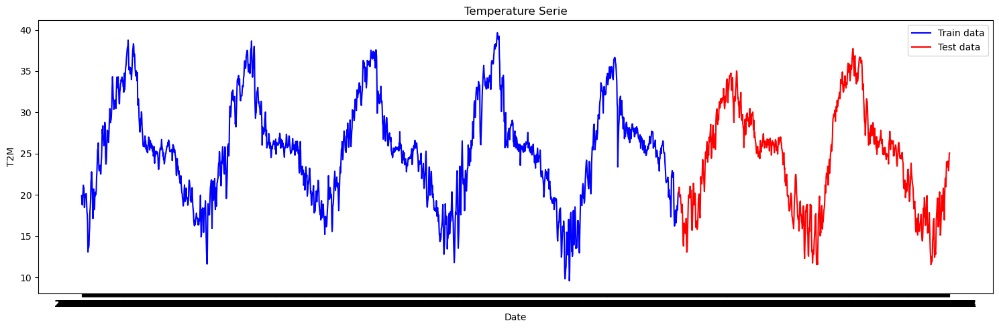

In [465]:
#plot the train and test data we have preparated

plt.figure(figsize=(15,5))
sns.lineplot(df['T2M'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['T2M'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df[::100]
# plt.xticks(selected_dates, rotation=45)
plt.title('Temperature Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [466]:
#check if it is a time series by looking at the autocorrelation
print(df['T2M'].autocorr())

0.9853736823832496


In [467]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['T2M'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,T2M,Yesterday
Date,,
2016-01-02,18.98,19.94
2016-01-03,18.80,18.98
2016-01-04,19.87,18.80
2016-01-05,20.30,19.87
2016-01-06,21.19,20.30


In [468]:
train_data

,T2M
Date,
2016-01-01,19.94
2016-01-02,18.98
2016-01-03,18.80
2016-01-04,19.87
2016-01-05,20.30
...,...
2020-11-30,18.73
2020-12-01,18.20
2020-12-02,19.40


In [469]:
y = daily_climate_['T2M']
X = daily_climate_['Yesterday']

In [470]:
X_train = X[: '2020-12-04']
X_test = X ['2020-12-04':]
y_train = y[:'2020-12-04']
y_test = y['2020-12-04':]

In [471]:
X_train

Date
2016-01-02    19.94
2016-01-03    18.98
2016-01-04    18.80
2016-01-05    19.87
2016-01-06    20.30
              ...  
2020-11-30    18.26
2020-12-01    18.73
2020-12-02    18.20
2020-12-03    19.40
2020-12-04    20.25
Name: Yesterday, Length: 1799, dtype: float64

In [472]:
X_test

Date
2020-12-04    20.25
2020-12-05    20.38
2020-12-06    20.27
2020-12-07    20.94
2020-12-08    20.16
              ...  
2023-02-25    24.11
2023-02-26    23.89
2023-02-27    22.94
2023-02-28    23.65
2023-03-01    24.98
Name: Yesterday, Length: 818, dtype: float64

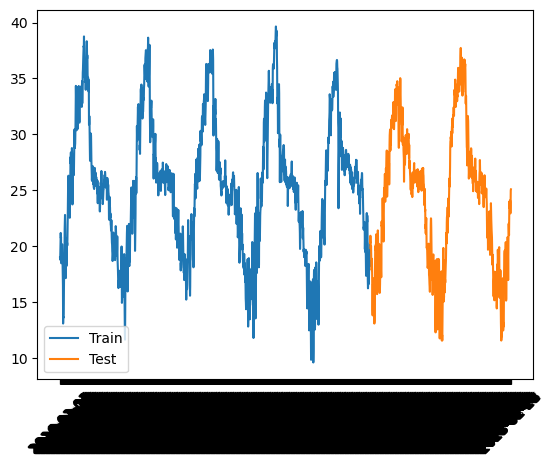

In [473]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [474]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

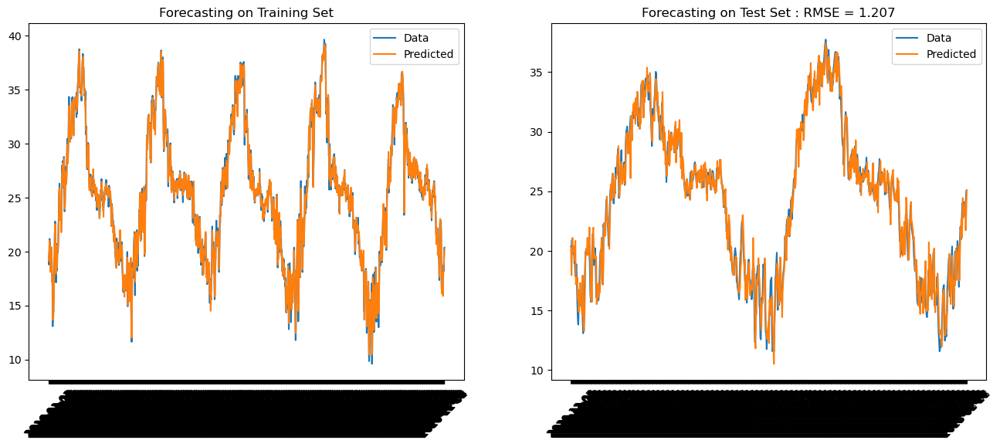

In [475]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['T2M'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend()

plt.subplot(1,2,2)
plt.plot(df_result_test['T2M'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend()

In [476]:
from joblib import dump
dump(rf_model, 'models\Bhopal_temperature.joblib')

['models\\Bhopal_temperature.joblib']

## Humidity

In [480]:
df = df.drop("T2M",axis = 1)

In [482]:
df

,RH2M
Date,
2016-01-01,32.75
2016-01-02,30.75
2016-01-03,30.75
2016-01-04,26.00
2016-01-05,25.75
...,...
2023-02-25,31.62
2023-02-26,31.94
2023-02-27,30.44


In [481]:
train_data = df.iloc[:1800]  # First 1800 rows for training
test_data = df.iloc[1800:]

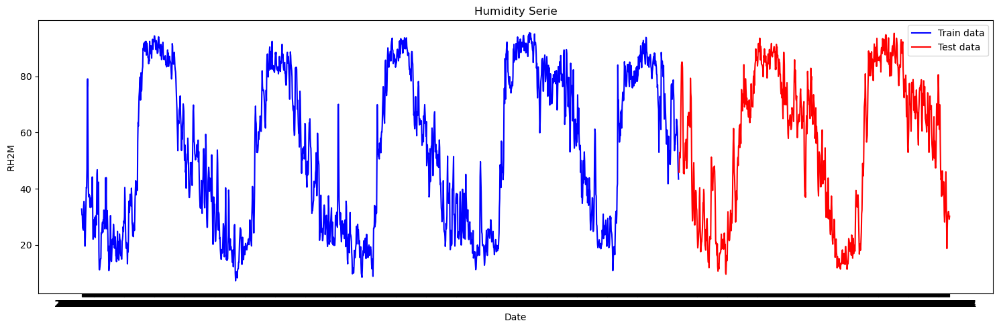

In [483]:
#plot the train and test data we have preparated

plt.figure(figsize=(15,5))
sns.lineplot(df['RH2M'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['RH2M'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df[::100]
# plt.xticks(selected_dates, rotation=45)
plt.title('Humidity Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [484]:
#check if it is a time series by looking at the autocorrelation
print(df['RH2M'].autocorr())

0.9806823317420327


In [485]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['RH2M'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,RH2M,Yesterday
Date,,
2016-01-02,30.75,32.75
2016-01-03,30.75,30.75
2016-01-04,26.00,30.75
2016-01-05,25.75,26.00
2016-01-06,25.25,25.75


In [486]:
train_data

,RH2M
Date,
2016-01-01,32.75
2016-01-02,30.75
2016-01-03,30.75
2016-01-04,26.00
2016-01-05,25.75
...,...
2020-11-30,62.06
2020-12-01,59.88
2020-12-02,51.50


In [487]:
y = daily_climate_['RH2M']
X = daily_climate_['Yesterday']

In [488]:
X_train = X[: '2020-12-04']
X_test = X ['2020-12-04':]
y_train = y[:'2020-12-04']
y_test = y['2020-12-04':]

In [489]:
X_train

Date
2016-01-02    32.75
2016-01-03    30.75
2016-01-04    30.75
2016-01-05    26.00
2016-01-06    25.75
              ...  
2020-11-30    63.44
2020-12-01    62.06
2020-12-02    59.88
2020-12-03    51.50
2020-12-04    46.25
Name: Yesterday, Length: 1799, dtype: float64

In [490]:
X_test

Date
2020-12-04    46.25
2020-12-05    43.44
2020-12-06    46.12
2020-12-07    45.81
2020-12-08    51.50
              ...  
2023-02-25    30.19
2023-02-26    31.62
2023-02-27    31.94
2023-02-28    30.44
2023-03-01    29.12
Name: Yesterday, Length: 818, dtype: float64

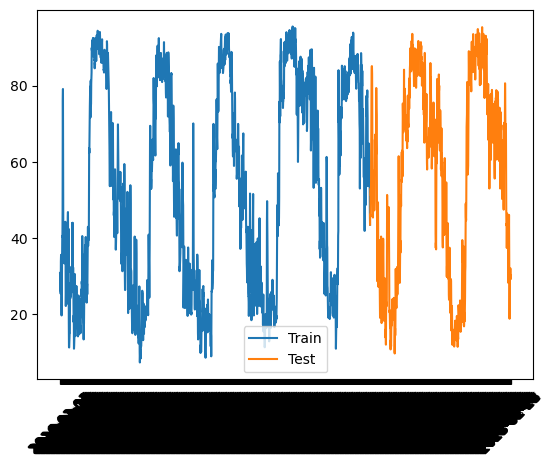

In [491]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [492]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

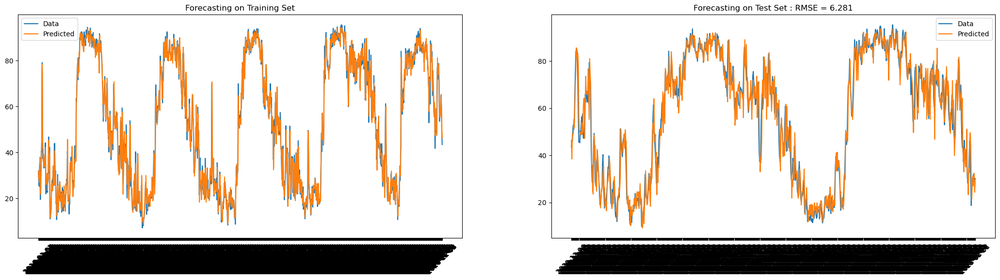

In [493]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(26,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['RH2M'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['RH2M'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [494]:
from joblib import dump
dump(rf_model, 'models\Bhopal_humidity.joblib')

['models\\Bhopal_humidity.joblib']

# **Srinagar**

## Temperature

In [514]:
df = pd.read_csv("datas/shringar_weather.csv")

In [515]:
df = df.drop("Unnamed: 0",axis = 1)

In [516]:
df["Date"] = pd.to_datetime(df["Date"])

In [517]:
df['Date']=pd.to_datetime(df['Date'])

In [518]:
df.set_index(df['Date'], inplace=True)
df = df.drop('Date', axis=1)
df.head()

,T2M,RH2M
Date,,
2016-01-01,2.83,32.25
2016-01-02,2.38,35.62
2016-01-03,2.74,41.12
2016-01-04,0.70,75.19
2016-01-05,-0.54,78.69


In [500]:
df = df.drop("RH2M",axis = 1)

In [501]:
train_data = df.iloc[:1800]  # First 1800 rows for training
test_data = df.iloc[1800:]

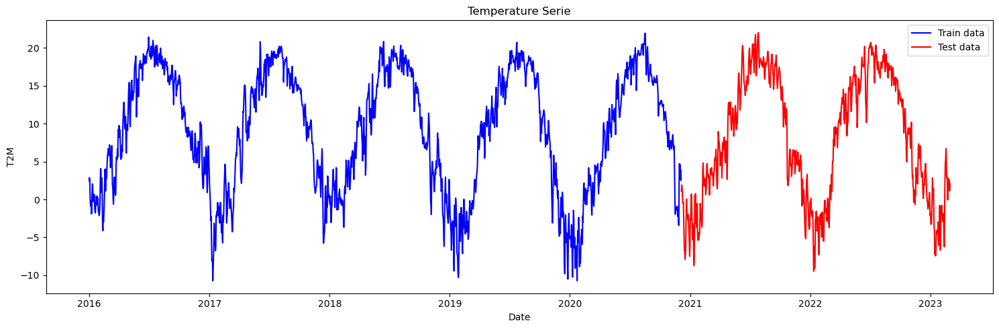

In [502]:
plt.figure(figsize=(15,5))
sns.lineplot(df['T2M'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['T2M'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df[::100]
# plt.xticks(selected_dates, rotation=45)
plt.title('Temperature Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [503]:
print(df['T2M'].autocorr())

0.9857673016560659


In [504]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['T2M'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,T2M,Yesterday
Date,,
2016-01-02,2.38,2.83
2016-01-03,2.74,2.38
2016-01-04,0.70,2.74
2016-01-05,-0.54,0.70
2016-01-06,-0.88,-0.54


In [505]:
train_data

,T2M
Date,
2016-01-01,2.83
2016-01-02,2.38
2016-01-03,2.74
2016-01-04,0.70
2016-01-05,-0.54
...,...
2020-11-30,2.65
2020-12-01,4.58
2020-12-02,3.10


In [506]:
y = daily_climate_['T2M']
X = daily_climate_['Yesterday']

In [507]:
X_train = X[: '2020-12-04']
X_test = X ['2020-12-04':]
y_train = y[:'2020-12-04']
y_test = y['2020-12-04':]

In [508]:
X_train

Date
2016-01-02    2.83
2016-01-03    2.38
2016-01-04    2.74
2016-01-05    0.70
2016-01-06   -0.54
              ... 
2020-11-30    4.72
2020-12-01    2.65
2020-12-02    4.58
2020-12-03    3.10
2020-12-04    3.88
Name: Yesterday, Length: 1799, dtype: float64

In [509]:
X_test

Date
2020-12-04    3.88
2020-12-05    2.53
2020-12-06    1.09
2020-12-07    1.91
2020-12-08    1.49
              ... 
2023-02-25    2.33
2023-02-26    2.73
2023-02-27    2.05
2023-02-28    2.59
2023-03-01    1.15
Name: Yesterday, Length: 818, dtype: float64

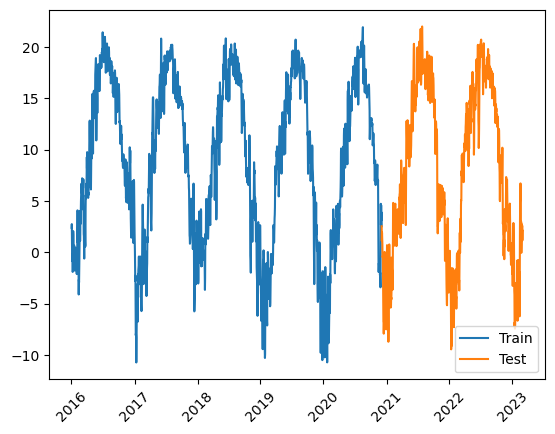

In [510]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [511]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

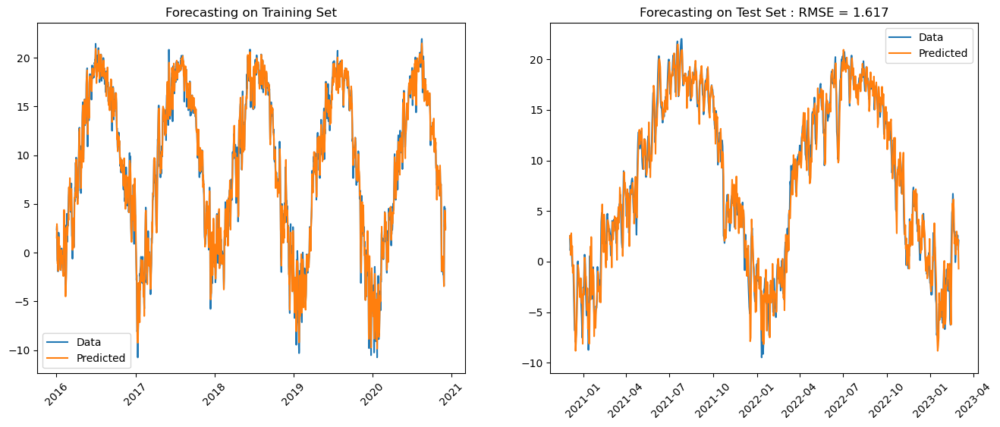

In [512]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['T2M'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['T2M'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [513]:
from joblib import dump
dump(rf_model, 'models\Srinagar_temperature.joblib')

['models\\Srinagar_temperature.joblib']

## Humidity

In [519]:
df = df.drop("T2M",axis = 1)

In [520]:
train_data = df.iloc[:1800]  # First 1800 rows for training
test_data = df.iloc[1800:]

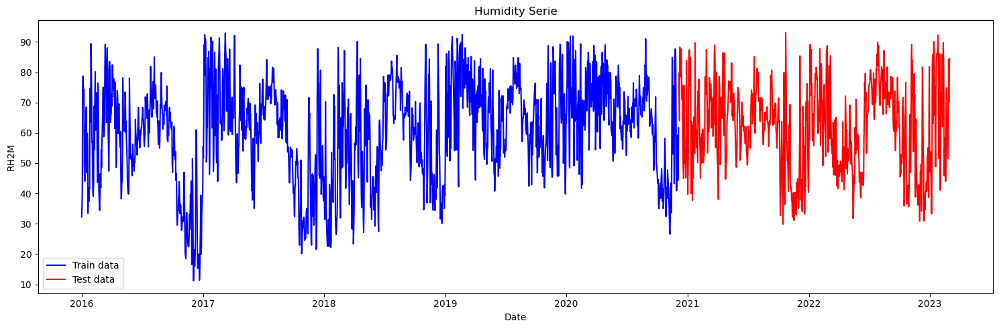

In [521]:
plt.figure(figsize=(15,5))
sns.lineplot(df['RH2M'].iloc[:train_data.shape[0]], color='blue', label='Train data')
sns.lineplot(df['RH2M'].iloc[-test_data.shape[0]:], color='red', label='Test data')
selected_dates = df[::100]
# plt.xticks(selected_dates, rotation=45)
plt.title('Humidity Serie')
plt.tight_layout()
plt.legend()
plt.show()

In [522]:
print(df['RH2M'].autocorr())

0.8219411737988662


In [523]:
df

,RH2M
Date,
2016-01-01,32.25
2016-01-02,35.62
2016-01-03,41.12
2016-01-04,75.19
2016-01-05,78.69
...,...
2023-02-25,55.62
2023-02-26,84.19
2023-02-27,69.94


In [524]:
daily_climate_ = df.copy(deep=True)
daily_climate_['Yesterday']=daily_climate_['RH2M'].shift()
daily_climate_.dropna(inplace=True)
daily_climate_.head()

,RH2M,Yesterday
Date,,
2016-01-02,35.62,32.25
2016-01-03,41.12,35.62
2016-01-04,75.19,41.12
2016-01-05,78.69,75.19
2016-01-06,75.38,78.69


In [525]:
train_data

,RH2M
Date,
2016-01-01,32.25
2016-01-02,35.62
2016-01-03,41.12
2016-01-04,75.19
2016-01-05,78.69
...,...
2020-11-30,57.69
2020-12-01,59.19
2020-12-02,52.81


In [526]:
y = daily_climate_['RH2M']
X = daily_climate_['Yesterday']

In [527]:
X_train = X[: '2020-12-04']
X_test = X ['2020-12-04':]
y_train = y[:'2020-12-04']
y_test = y['2020-12-04':]

In [528]:
X_train

Date
2016-01-02    32.25
2016-01-03    35.62
2016-01-04    41.12
2016-01-05    75.19
2016-01-06    78.69
              ...  
2020-11-30    44.19
2020-12-01    57.69
2020-12-02    59.19
2020-12-03    52.81
2020-12-04    44.44
Name: Yesterday, Length: 1799, dtype: float64

In [529]:
X_test

Date
2020-12-04    44.44
2020-12-05    61.75
2020-12-06    79.69
2020-12-07    71.31
2020-12-08    64.00
              ...  
2023-02-25    51.44
2023-02-26    55.62
2023-02-27    84.19
2023-02-28    69.94
2023-03-01    81.69
Name: Yesterday, Length: 818, dtype: float64

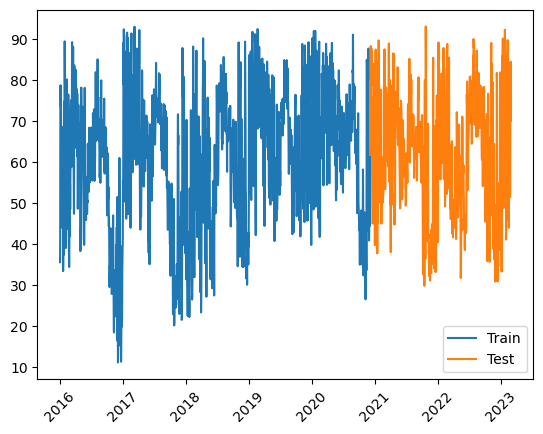

In [530]:
plt.plot(y_train,label='Train')
plt.plot(y_test,label='Test')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [531]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=500)
rf_model.fit(X_train.values.reshape(-1,1), y_train)

yt = rf_model.predict(X_train.values.reshape(-1,1))
yp = rf_model.predict(X_test.values.reshape(-1,1))

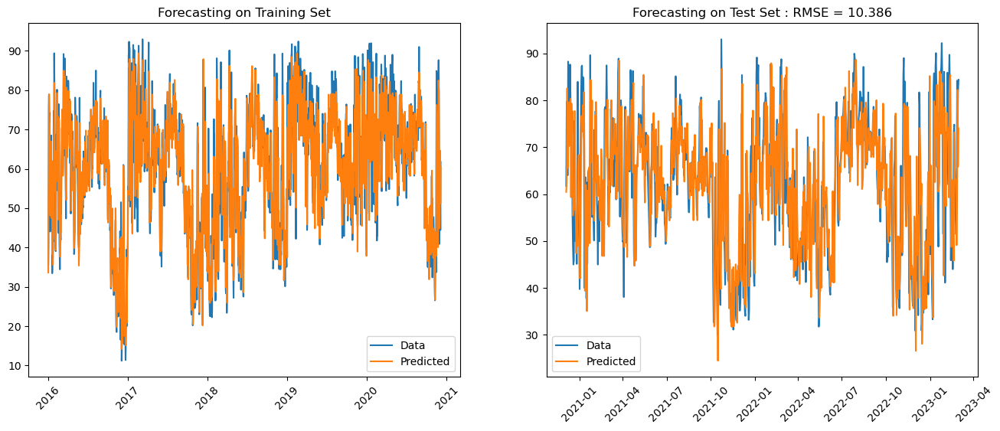

In [532]:
df_result_train = pd.DataFrame(y_train)
df_result_train['predicted'] = yt
df_result_test = pd.DataFrame(y_test)
df_result_test['predicted'] = yp
#%%
fig,axes = plt.subplots(1,2,figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(df_result_train['RH2M'],label='Data')
plt.plot(df_result_train['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Training Set")
plt.legend();

plt.subplot(1,2,2)
plt.plot(df_result_test['RH2M'],label='Data')
plt.plot(df_result_test['predicted'],label='Predicted')
plt.xticks(rotation=45)
plt.title("Forecasting on Test Set : RMSE = %.3f"%math.sqrt(mean_squared_error(yp,y_test)))
plt.legend();

In [533]:
from joblib import dump
dump(rf_model, 'models\Srinagar_humidity.joblib')

['models\\Srinagar_humidity.joblib']

In [ ]:
!pip install streamlit
import streamlit as st
selected_date = st.date_input("Select a date", key='date_picker')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 17.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 63.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.3 MB/s eta 0:00:00
  Attempting uninstall: importlib-metadata
    Found existing installation: importlib-metadata 7.0.0
    Uninstalling importlib-metadata-7.0.0:
      Successfully uninstalled importlib-metadata-7.0.0


2023-12-29 18:50:27.910 
  command:

    streamlit run /usr/local/lib/python3.10/dist-packages/colab_kernel_launcher.py [ARGUMENTS]


In [ ]:
!streamlit run /usr/local/lib/python3.10/dist-packages/colab_kernel_launcher.py




  You can now view your Streamlit app in your browser.

  Network URL: http://172.28.0.12:8501
  External URL: http://34.86.26.94:8501

  Stopping...
^C
